In [1]:
import pandas as pd
import numpy as np
import mylibrary as lib
import plotly.express as px
import plotly.graph_objs as go
import plotly.io as pio
import random
import copy
import matrixprofile as mp
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import stumpy

In [2]:
df, filename = lib.preprocess.upload.upload_csv()

In [3]:
df['DateTime'] = pd.to_datetime(df['DateTime'])
df = df.drop('Hid_Pomp_Motor_Rulman', axis = 1)
df = df.dropna()

In [4]:
dt1 = pd.to_datetime('2023-07-14 00:00:04')
dt2 = pd.to_datetime('2023-07-14 23:59:04')
df['DateTime'] = pd.to_datetime(df['DateTime'])
df = df[(df['DateTime'] >= dt1) & (df['DateTime'] <= dt2)]

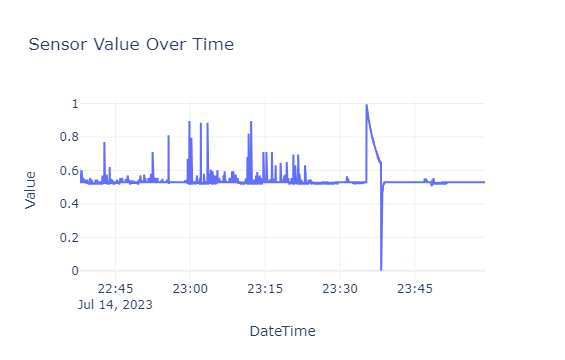

In [80]:
lib.plot.linechart.plot_line_chart(df1)

In [5]:
df1 = df.copy() 
df1 = lib.preprocess.scale.apply_min_max_scale(df1)
df_resampled = df1.resample('2s', on='DateTime').mean().reset_index()

In [6]:
def smoothing(x, k):
    width = 1 / k

    for i in range(k):
        min = i * width
        max = (i + 1) * width

        if min <= x <= max:
            return min

    return "Geçersiz değer"
def apply_smoothing_to_dataframe(df, k):
    result_df = df.copy()

    for column in result_df.columns:
        if column != 'DateTime':
            result_df[f'{column}_binned'] = result_df[column].apply(lambda x: smoothing(x, k))

    return result_df

In [7]:
k = 200
df_resampled = apply_smoothing_to_dataframe(df_resampled, k)
df_resampled

,DateTime,Hid_Pomp_Balans,Hid_emn_bas_act,Hid_Pomp_Balans_binned,Hid_emn_bas_act_binned
0,2023-07-14 00:00:04,0.407407,0.533594,0.405,0.53
1,2023-07-14 00:00:06,0.407407,0.533594,0.405,0.53
2,2023-07-14 00:00:08,0.444444,0.533594,0.440,0.53
3,2023-07-14 00:00:10,0.444444,0.533594,0.440,0.53
4,2023-07-14 00:00:12,0.444444,0.533594,0.440,0.53
...,...,...,...,...,...
43166,2023-07-14 23:58:56,0.617284,0.533594,0.615,0.53
43167,2023-07-14 23:58:58,0.617284,0.533594,0.615,0.53
43168,2023-07-14 23:59:00,0.617284,0.533594,0.615,0.53
43169,2023-07-14 23:59:02,0.617284,0.533594,0.615,0.53


In [8]:
df_resampled[df_resampled["DateTime"] >'2023-07-14 23:35:018']

,DateTime,Hid_Pomp_Balans,Hid_emn_bas_act,Hid_Pomp_Balans_binned,Hid_emn_bas_act_binned
42458,2023-07-14 23:35:20,0.679012,1.000000,0.675,0.995
42459,2023-07-14 23:35:22,0.679012,0.987394,0.675,0.985
42460,2023-07-14 23:35:24,0.679012,0.987394,0.675,0.985
42461,2023-07-14 23:35:26,0.654321,0.974789,0.650,0.970
42462,2023-07-14 23:35:28,0.654321,0.962183,0.650,0.960
...,...,...,...,...,...
43166,2023-07-14 23:58:56,0.617284,0.533594,0.615,0.530
43167,2023-07-14 23:58:58,0.617284,0.533594,0.615,0.530
43168,2023-07-14 23:59:00,0.617284,0.533594,0.615,0.530
43169,2023-07-14 23:59:02,0.617284,0.533594,0.615,0.530


In [9]:
sensors = df_resampled.columns[1:]
sensors

Index(['Hid_Pomp_Balans', 'Hid_emn_bas_act', 'Hid_Pomp_Balans_binned',
       'Hid_emn_bas_act_binned'],
      dtype='object')

In [10]:
df1 = df_resampled[['DateTime','Hid_emn_bas_act_binned']]
df1 = df1.dropna()
df1

,DateTime,Hid_emn_bas_act_binned
0,2023-07-14 00:00:04,0.53
1,2023-07-14 00:00:06,0.53
2,2023-07-14 00:00:08,0.53
3,2023-07-14 00:00:10,0.53
4,2023-07-14 00:00:12,0.53
...,...,...
43166,2023-07-14 23:58:56,0.53
43167,2023-07-14 23:58:58,0.53
43168,2023-07-14 23:59:00,0.53
43169,2023-07-14 23:59:02,0.53


In [11]:
import numpy as np
import matplotlib.pyplot as plt

def plot_mp_results(df, mp, precision, recall, anomaly_count, noise, wave_len, window, discord_count=None):
    mp = np.ma.masked_equal(mp, np.inf)
    data = mp.astype(float)
    data_2d = data.reshape(1, -1)
    
    plt.rcParams["figure.figsize"] = 20, 9  
    
    fig, (ax2, ax, ax3) = plt.subplots(nrows=3, sharex=True)
    
    extent = [0, len(data), 0, 1]
    heatmap = ax.imshow(data_2d, cmap="coolwarm", aspect="auto", extent=extent)
    ax.set_yticks([])
    ax.set_xlim(extent[0], extent[1])
    
    ax2.plot(df[sensors[-1]].values)
    ax2.set_ylabel('Orijinal veri', fontsize='10')
    
    cbar = fig.colorbar(heatmap, ax=ax, orientation='horizontal', pad=0.02)
    cbar.set_label('Renk Çubuğu Etiketi')  
    
    ax3.set_ylabel('Matris Profili', fontsize='10')
    ax3.plot(mp.reshape(-1, 1))
    ax3.set_xlabel('Zaman', fontsize='10')
    
    if discord_count is not None:
        top_idxs = np.argsort(mp)[::-1][:discord_count]
        for idx in top_idxs:
            ax3.plot(idx, mp[idx], 'ro')  
    
    ax.set_ylim(0, 1)
    
    # Add titles
    title = f"Precision: {precision}, Recall: {recall}, Anomaly Count: {anomaly_count}, Noise: {noise}, Wave Length: {wave_len}, Window: {window}"
    fig.suptitle(title, fontsize=16)
    
    plt.tight_layout()
    plt.show()


In [12]:
df_results = pd.DataFrame(columns=['data', 'noise', 'anomaly count',  'wave len', 'window', 'precision', 'recall', 'anomaly_normal_ratio', 'noise direction'])

In [13]:
def union_window(set1, set2, window_size):
    union_set = set()

    for elem1 in set1:
        for elem2 in set2:
            if abs(elem1 - elem2) < window_size:
                union_set.add(elem1)

    return union_set

# def set_difference_window(set1, set2, window_size):
#     diff_set = set()

#     for elem1 in set1:
#         should_include = True
#         for elem2 in set2:
#             if abs(elem1 - elem2) < window_size:
#                 should_include = False
#                 break
#         if should_include:
#             diff_set.add(elem1)

#     return diff_set


In [14]:
def get_metrics(anomaly_points, outliers, window_size):
    set_a = set(anomaly_points)
    set_b = set(outliers)
    
    tp = len(union_window(set_a, set_b, window_size))
   

    precision = tp/len(set_b)
    recall = tp/len(set_a)


    return precision, recall

In [15]:
def plot_metrics(precision_values, recall_values, m):
    plt.figure(figsize=(10, 6))
    plt.plot(m, precision_values, label='Precision')
    plt.plot(m, recall_values, label='Recall')
    plt.xlabel('m_value')
    plt.ylabel('Score')
    plt.title('Precision and Recall vs m_value')
    plt.legend()
    plt.grid(True)
    plt.show()

## Testing

In [16]:
df_results2 = df_results.copy()
df_results2["m"] = 0
df_results2.columns

Index(['data', 'noise', 'anomaly count', 'wave len', 'window', 'precision',
       'recall', 'anomaly_normal_ratio', 'noise direction', 'm'],
      dtype='object')

In [17]:
df2 = df1.copy()
df2, anomaly_points = lib.preprocess.anomaly.apply_anomaly(df2, noise = 0.5, anomaly_normal_ratio = 0.00013, noise_direction = 'n', random_state = 300,wave = True, wave_length = 15)

anomaly_points = np.reshape(anomaly_points[sensors[-1]],-1)
anomaly_points = anomaly_points.tolist()
anomaly_points.extend([42549, 42548, 42441, 42457, 42547, 42442, 42456, 42527, 42443,
                            42546, 42455, 42545, 42444, 42544, 42528, 42543, 42542, 42541,
                            42540, 42539, 42538, 42529, 42537, 42536, 42454, 42535, 42530,
                            42534, 42445, 42533, 42531, 42532, 42453, 42446, 42452, 42451,
                            42447, 42450, 42449, 42448])

anomaly_points = np.array(anomaly_points)

window = 15 * 2  if 15 * 2 > 20 else 20

Hid_emn_bas_act_binned
5 ANOMALIES


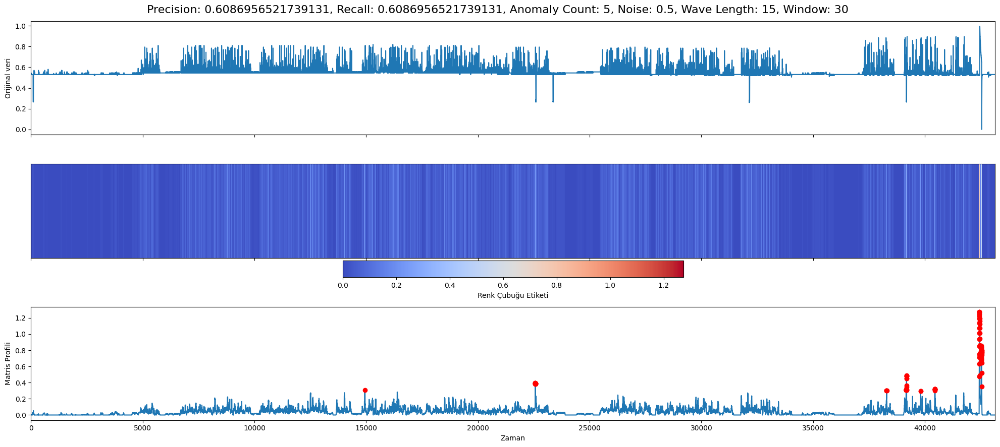

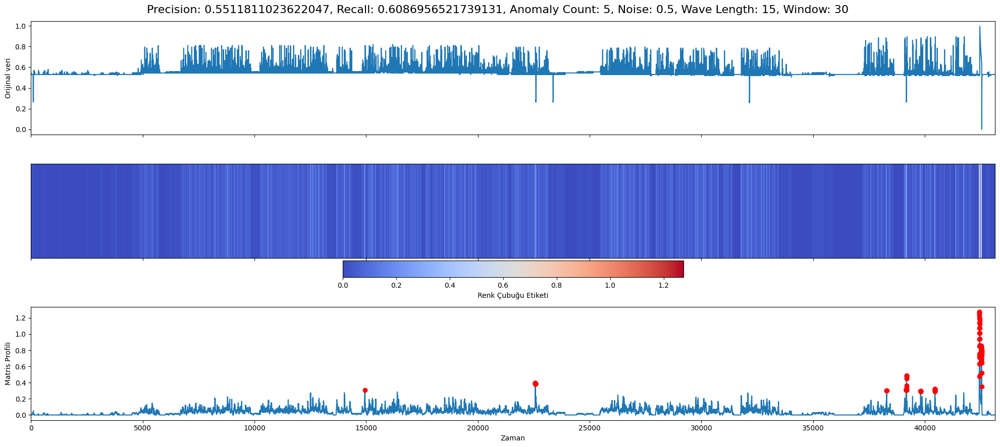

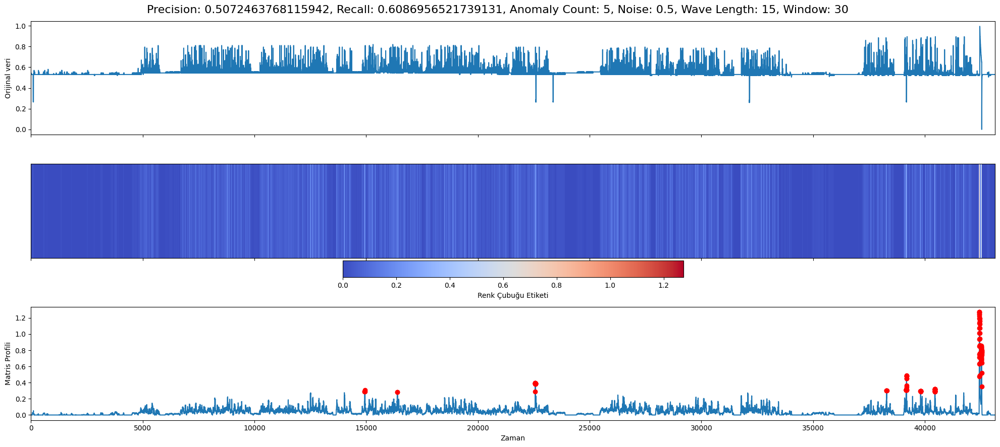

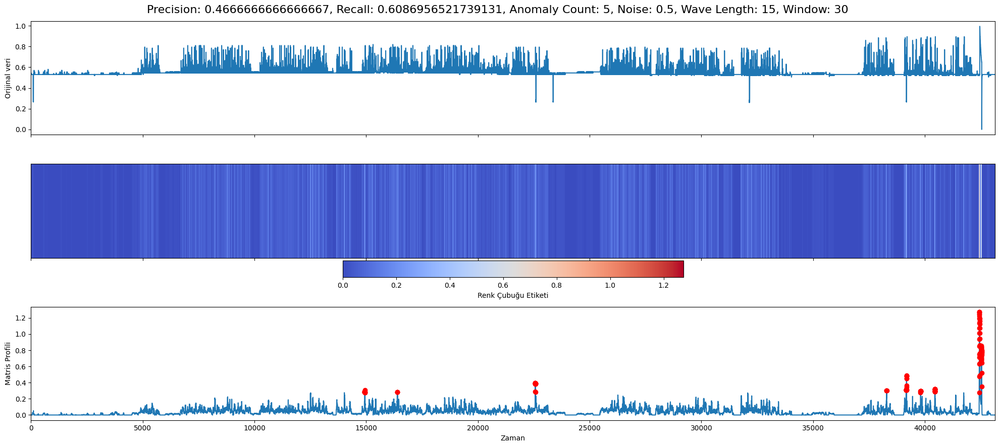

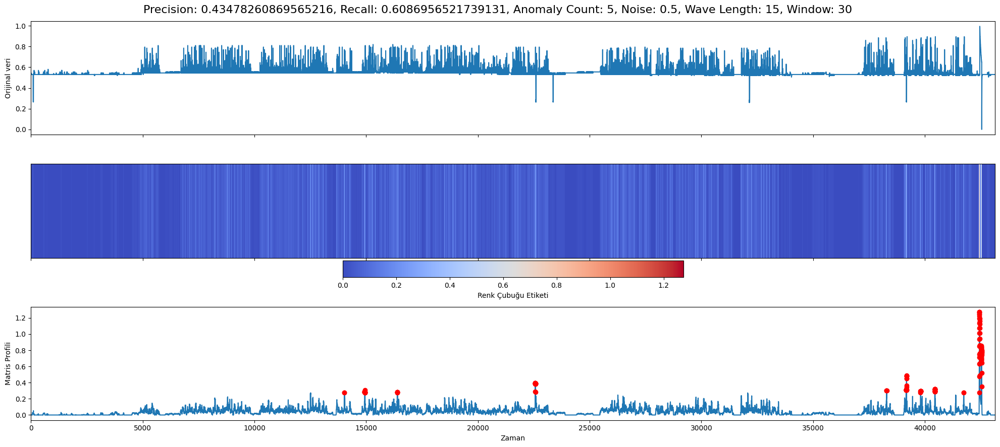

...

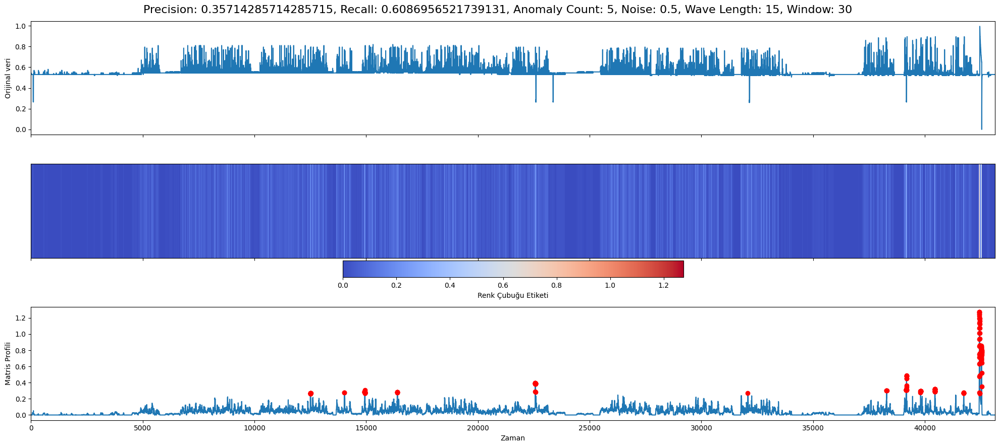

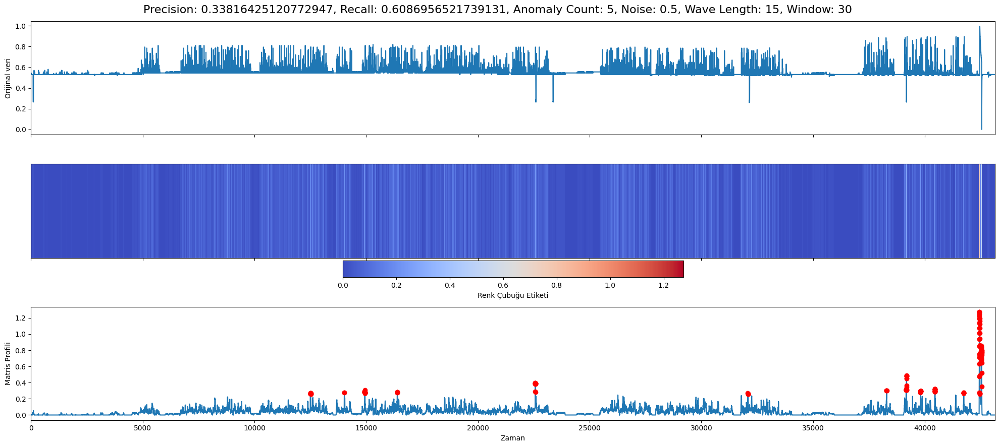

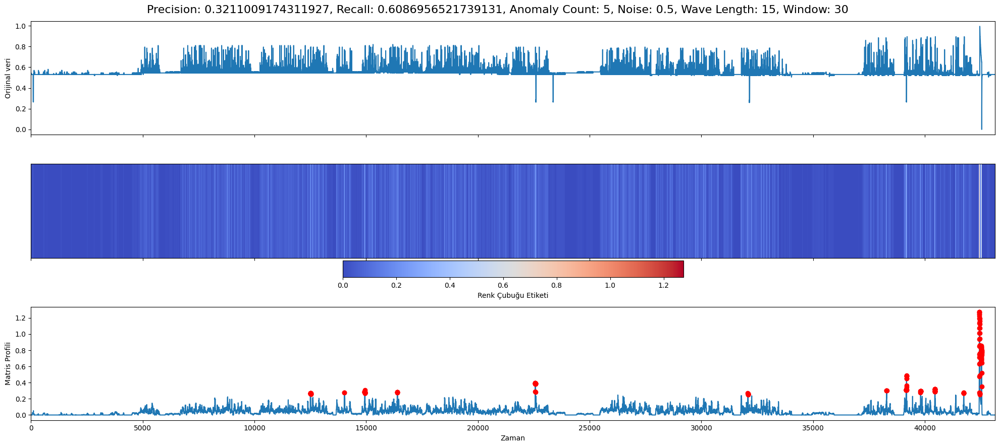

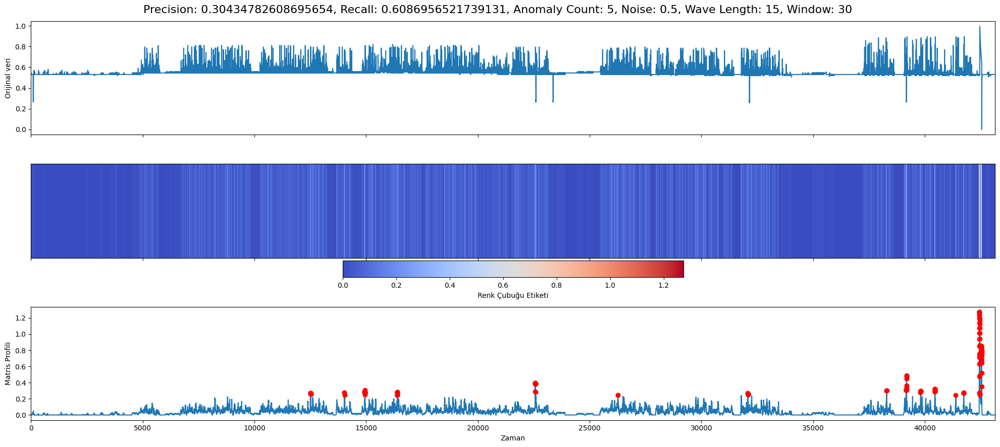

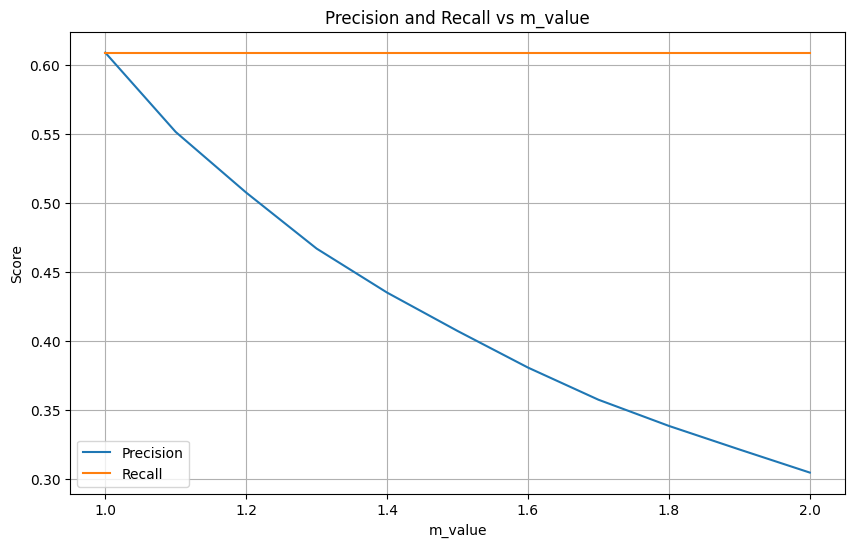

,data,noise,anomaly count,wave len,window,precision,recall,anomaly_normal_ratio,noise direction,m
0,77,0.5,5,15,30,0.608696,0.608696,0.00013,n,1.0
1,77,0.5,5,15,30,0.551181,0.608696,0.00013,n,1.1
2,77,0.5,5,15,30,0.507246,0.608696,0.00013,n,1.2
3,77,0.5,5,15,30,0.466667,0.608696,0.00013,n,1.3
4,77,0.5,5,15,30,0.434783,0.608696,0.00013,n,1.4
5,77,0.5,5,15,30,0.406977,0.608696,0.00013,n,1.5
6,77,0.5,5,15,30,0.380435,0.608696,0.00013,n,1.6
7,77,0.5,5,15,30,0.357143,0.608696,0.00013,n,1.7
8,77,0.5,5,15,30,0.338164,0.608696,0.00013,n,1.8
9,77,0.5,5,15,30,0.321101,0.608696,0.00013,n,1.9


In [18]:
# Lists to store precision and recall values
precision_values = []
recall_values = []

# Iterate over different values of m
for m_value in [round(i*0.1,1) for i in range(10, 21)]:
    b = round(len(anomaly_points) * m_value)

    T_full = df2[sensors[-1]]
    stream = stumpy.stumpi(T_full, window, egress=True, normalize=False)

    discords = np.argsort(stream.P_)[-int(b):]
    precision1, recall1 = get_metrics(anomaly_points, discords, window)  # Assuming get_metrics is defined elsewhere


    plot_mp_results(df2, stream.P_, precision1, recall1, 5, 0.5, 15, window, discord_count=b)

    row = {'data': 77, 'noise': 0.5, 'anomaly count': 5,  
           'wave len': 15, 'window' : window, 'precision' : precision1, 'recall' : recall1, 
           'anomaly_normal_ratio' : 0.00013, 'noise direction' : 'n', 'm' : m_value}
    df_results2 = pd.concat([df_results2, pd.DataFrame([row])], ignore_index=True)

    # Store precision and recall values
    precision_values.append(precision1)
    recall_values.append(recall1)

# Plot line chart
plt.figure(figsize=(10, 6))
plt.plot([round(i*0.1,1) for i in range(10, 21)], precision_values, label='Precision')
plt.plot([round(i*0.1,1) for i in range(10, 21)], recall_values, label='Recall')
plt.xlabel('m_value')
plt.ylabel('Score')
plt.title('Precision and Recall vs m_value')
plt.legend()
plt.grid(True)
plt.show()

df_results2

In [20]:
#point noise
df3 = df1.copy()
df3, anomaly_points3 = lib.preprocess.anomaly.apply_anomaly(df3, noise = 0.5, anomaly_normal_ratio = 0.00013, noise_direction = 'n', random_state = 300)

anomaly_points3 = np.reshape(anomaly_points3[sensors[-1]],-1)
anomaly_points3 = anomaly_points3.tolist()
anomaly_points3.extend([42549, 42548, 42441, 42457, 42547, 42442, 42456, 42527, 42443,
                            42546, 42455, 42545, 42444, 42544, 42528, 42543, 42542, 42541,
                            42540, 42539, 42538, 42529, 42537, 42536, 42454, 42535, 42530,
                            42534, 42445, 42533, 42531, 42532, 42453, 42446, 42452, 42451,
                            42447, 42450, 42449, 42448])

anomaly_points3 = np.array(anomaly_points3)

window = 15 * 2  if 15 * 2 > 20 else 20

Hid_emn_bas_act_binned
5 ANOMALIES


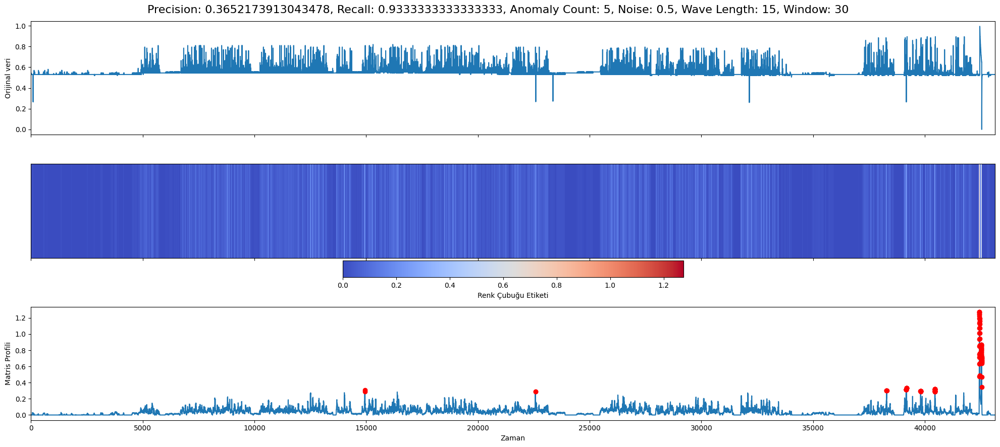

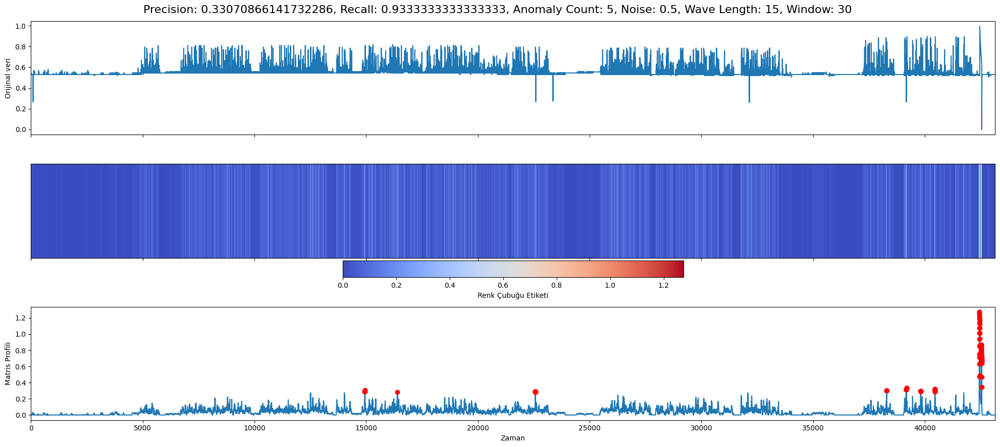

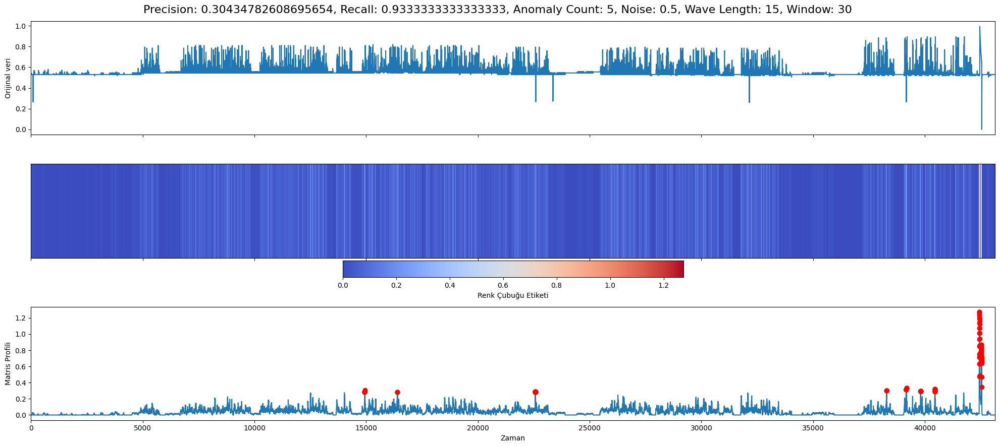

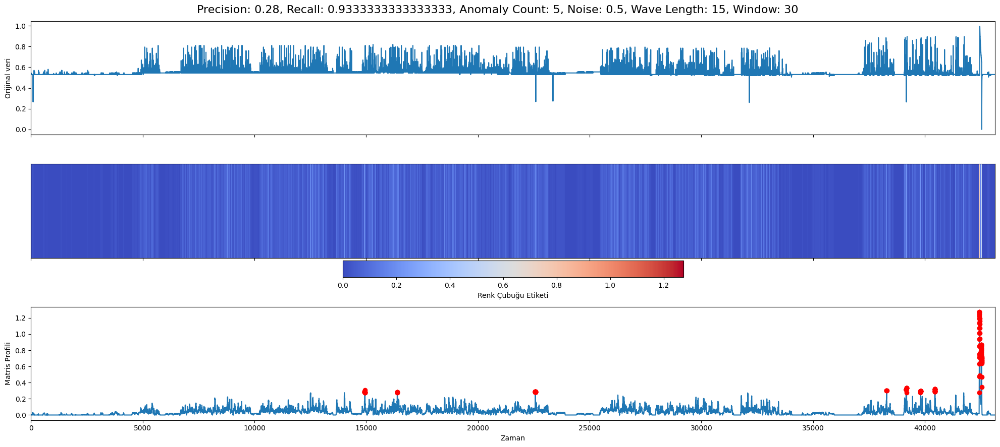

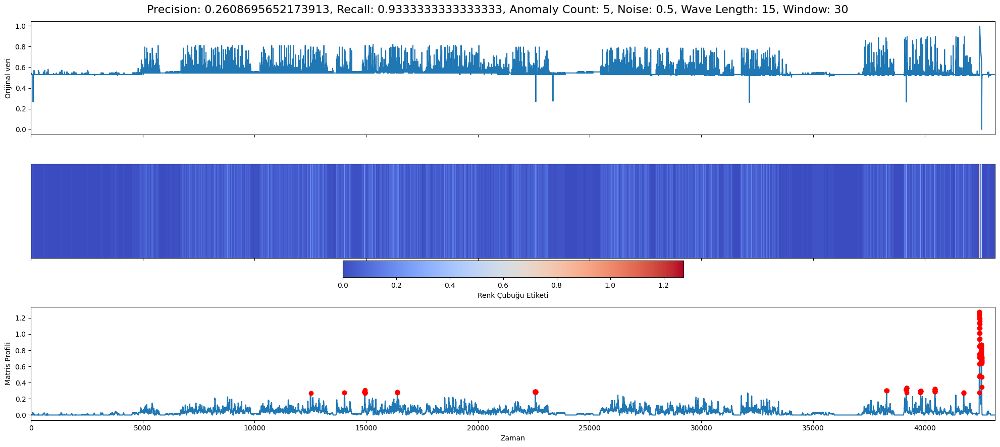

...

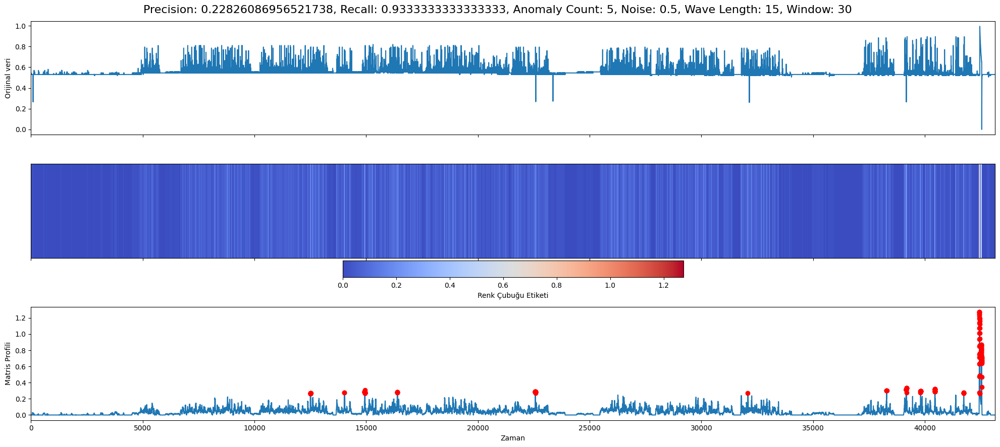

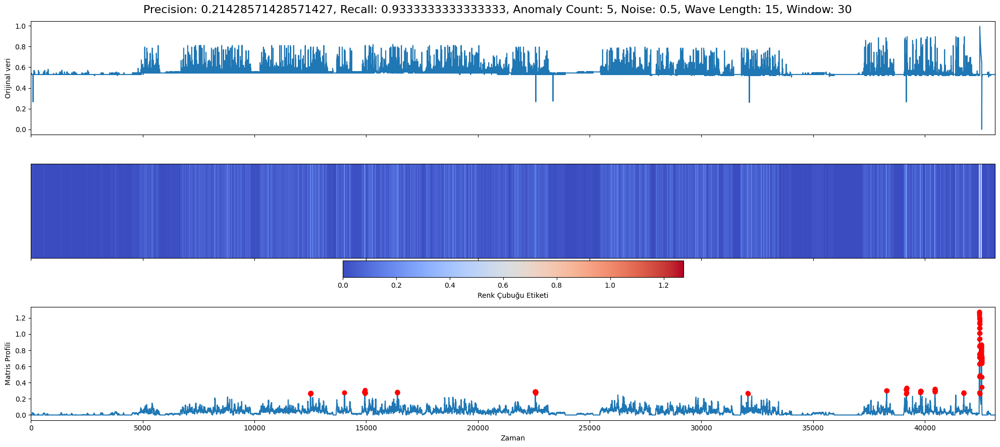

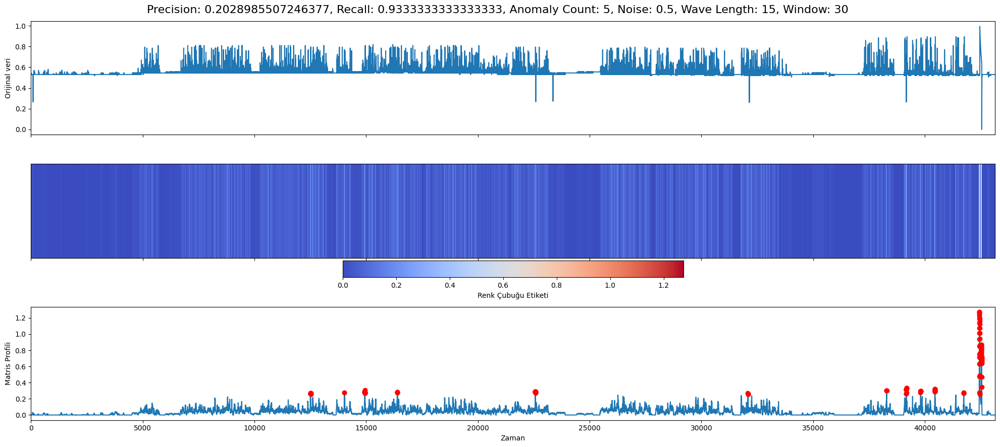

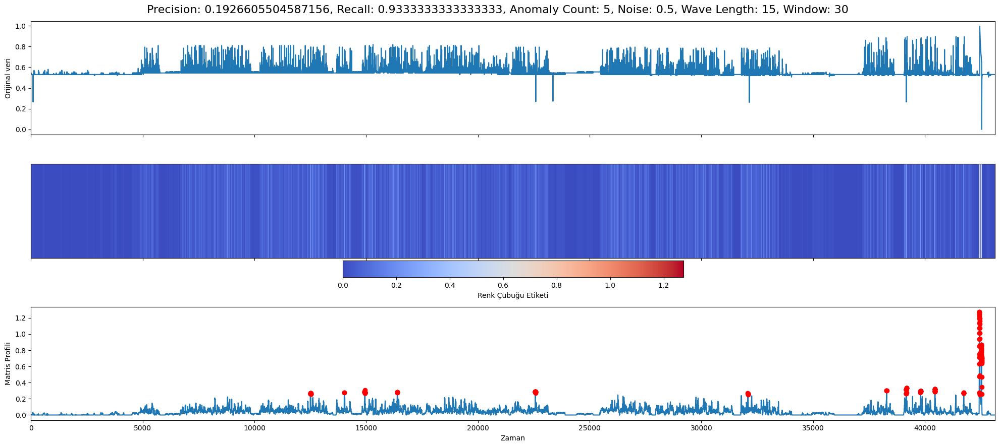

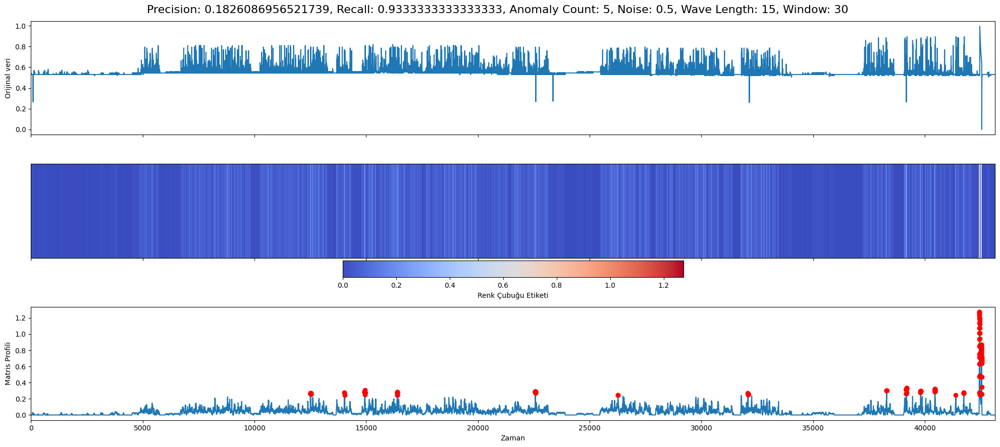

ValueError: x and y must have same first dimension, but have shapes (11,) and (0,)

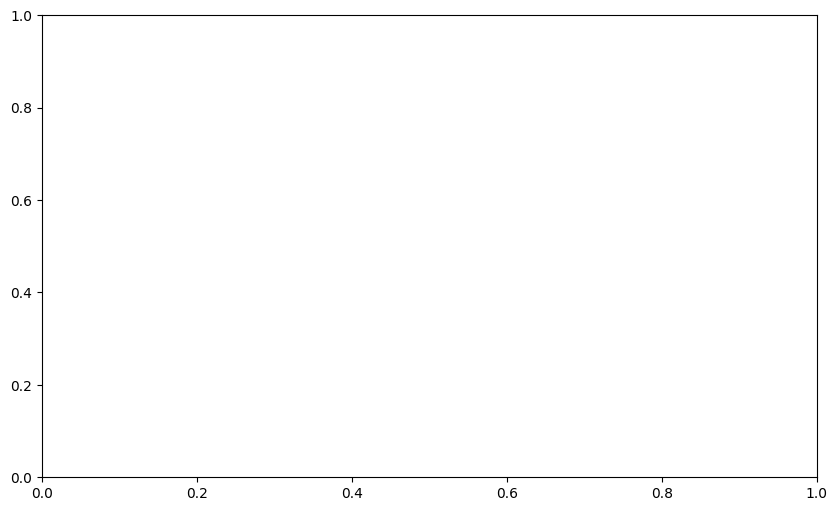

In [21]:
# Lists to store precision and recall values
precision_values3 = []
recall_values3 = []

# Iterate over different values of m
for m_value in [round(i*0.1,1) for i in range(10, 21)]:
    b = round(len(anomaly_points) * m_value)

    T_full = df3[sensors[-1]]
    stream = stumpy.stumpi(T_full, window, egress=True, normalize=False)

    discords3 = np.argsort(stream.P_)[-int(b):]
    precision3, recall3 = get_metrics(anomaly_points3, discords3, window)  # Assuming get_metrics is defined elsewhere


    plot_mp_results(df3, stream.P_, precision3, recall3, 5, 0.5, 15, window, discord_count=b)

    row = {'data': 77, 'noise': 0.5, 'anomaly count': 5,  
           'wave len': 15, 'window' : window, 'precision' : precision3, 'recall' : recall3, 
           'anomaly_normal_ratio' : 0.00013, 'noise direction' : 'n', 'm' : m_value}
    df_results2 = pd.concat([df_results2, pd.DataFrame([row])], ignore_index=True)

    # Store precision and recall values
    precision_values3.append(precision3)
    recall_values3.append(recall3)

# Plot line chart
plt.figure(figsize=(10, 6))
plt.plot([round(i*0.1,1) for i in range(10, 21)], precision_values3, label='Precision')
plt.plot([round(i*0.1,1) for i in range(10, 21)], recall_values3, label='Recall')
plt.xlabel('m_value')
plt.ylabel('Score')
plt.title('Precision and Recall vs m_value')
plt.legend()
plt.grid(True)
plt.show()

df_results2

In [22]:
precision_values3

[]

In [ ]:
plot_mp_results(df2, stream.P_, 0, 0, 0, 0, 0, 0, discord_count=b)

In [232]:
from stumpy import core, config
config.STUMPY_EXCL_ZONE_DENOM = 2 


def get_results(df, anomaly_normal_ratio, anomaly_count, wave_length, noise, df_results):
    df1 = df.copy()
    df1, anomaly_points = lib.preprocess.anomaly.apply_anomaly(df1, noise = noise, anomaly_normal_ratio = anomaly_normal_ratio, noise_direction = 'n', random_state = 300,wave = True, wave_length = wave_length)

    window = wave_length * 2  if wave_length * 2 > 20 else 20
    
    # b = 2 * anomaly_count * window
    m = [i for i in range(1,2, 0.1)]
    b = len(anomaly_points) * m

    T_full = df1[sensors[-1]]
    stream = stumpy.stumpi(T_full, window, egress=True, normalize=False)

    discords = np.argsort(stream.P_)[-int(b):]

    

    anomaly_points = np.reshape(anomaly_points[sensors[-1]],-1)
    precision1, recall1 = get_metrics(anomaly_points, discords, window)
    print(precision1, recall1)

    plot_mp_results(df1, stream.P_, precision1, recall1, anomaly_count, noise, wave_length, window, discord_count=b)

    row = {'data': 77, 'noise': noise, 'anomaly count': anomaly_count,  
    'wave len': wave_length, 'window' : window, 'precision' : precision1, 'recall' : recall1, 
    'anomaly_normal_ratio' : anomaly_normal_ratio, 'noise direction' : 'n'}
    df_results = pd.concat([df_results, pd.DataFrame([row])], ignore_index=True)
    return df_results

In [21]:
from stumpy import core, config
config.STUMPY_EXCL_ZONE_DENOM = 2 


def get_results2(df, anomaly_normal_ratio, anomaly_count, wave_length, noise, df_results):
    df1 = df.copy()
    df1, anomaly_points = lib.preprocess.anomaly.apply_anomaly(df1, noise = noise, anomaly_normal_ratio = anomaly_normal_ratio, noise_direction = 'n', random_state = 300,wave = True, wave_length = wave_length)

    # Adding data's anomaly
    anomaly_points = np.reshape(anomaly_points[sensors[-1]],-1)
    anomaly_points = anomaly_points.tolist()
    anomaly_points.extend([42549, 42548, 42441, 42457, 42547, 42442, 42456, 42527, 42443,
                                42546, 42455, 42545, 42444, 42544, 42528, 42543, 42542, 42541,
                                42540, 42539, 42538, 42529, 42537, 42536, 42454, 42535, 42530,
                                42534, 42445, 42533, 42531, 42532, 42453, 42446, 42452, 42451,
                                42447, 42450, 42449, 42448])
    
    anomaly_points = np.array(anomaly_points)

    window = wave_length * 2  if wave_length * 2 > 20 else 20
    
    precision_values = []
    recall_values = []

    plot = False
    
    m = [round(i*0.1,1) for i in range(10, 21)]
    
    for m_value in [round(i*0.1,1) for i in range(10, 21)]:
        b = round(len(anomaly_points) * m_value)
    
        T_full = df1[sensors[-1]]
        stream = stumpy.stumpi(T_full, window, egress=True, normalize=False)
    
        discords = np.argsort(stream.P_)[-int(b):]
        precision1, recall1 = get_metrics(anomaly_points, discords, window) 
    
        if not plot:
            plot_mp_results(df1, stream.P_, precision1, recall1, anomaly_count, noise, wave_length, window, discord_count=b)
            plot = True

    
        row = {'data': 77, 'noise': noise, 'anomaly count': anomaly_count,  
        'wave len': wave_length, 'window' : window, 'precision' : precision1, 'recall' : recall1, 
        'anomaly_normal_ratio' : anomaly_normal_ratio, 'noise direction' : 'n', 'm' : m_value}
        
        df_results = pd.concat([df_results, pd.DataFrame([row])], ignore_index=True)
    
       
        precision_values.append(precision1)
        recall_values.append(recall1)

    plot_metrics(precision_values, recall_values, m)
    return df_results

In [22]:
wave_lengths = [1, 15, 60]
noises = [0.5, 0.25, 0.1]
anomaly_counts = [1, 5, 10]
anomaly_normal_ratios = {1: 0.000025, 5: 0.00013, 10: 0.00024}

Hid_emn_bas_act_binned
1 ANOMALIES


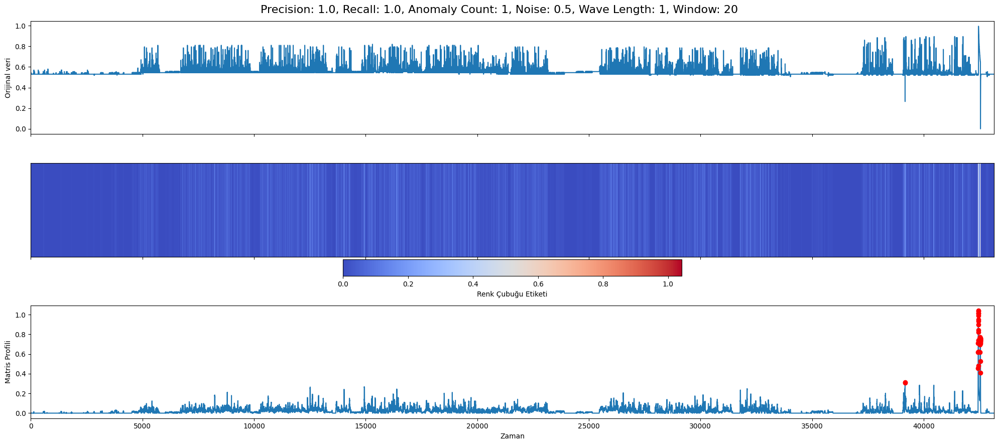

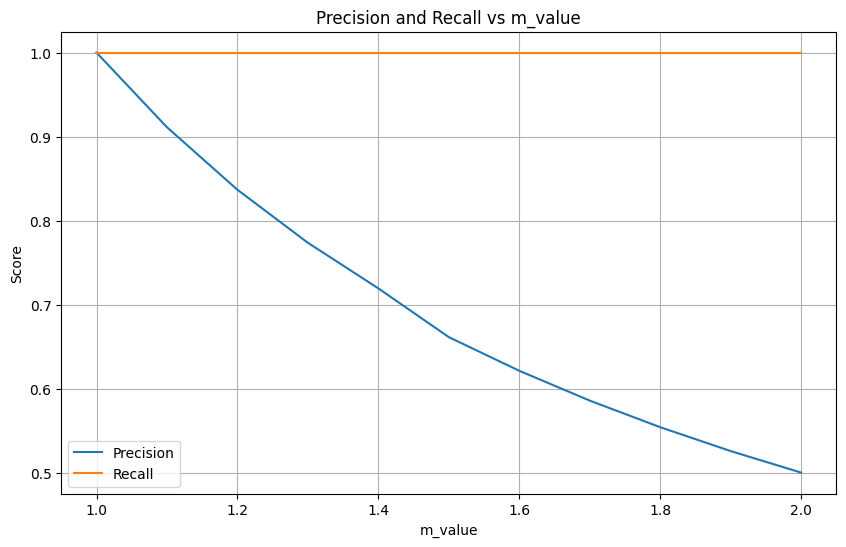

Hid_emn_bas_act_binned
5 ANOMALIES


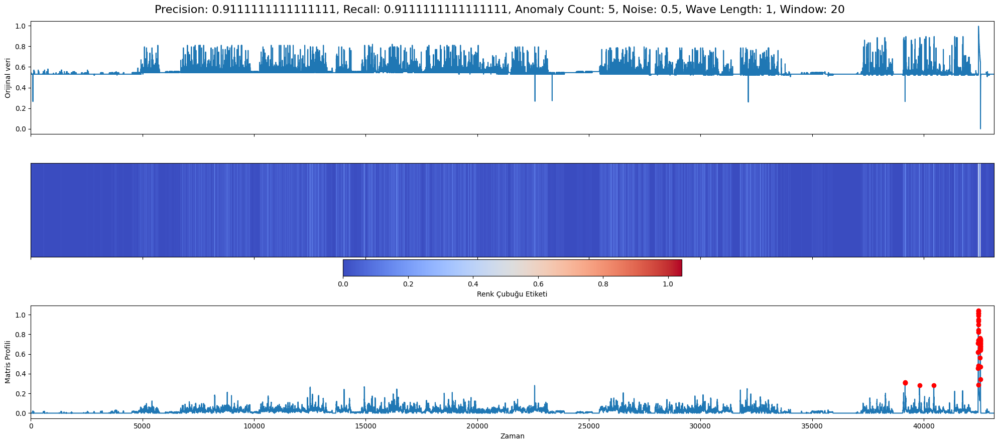

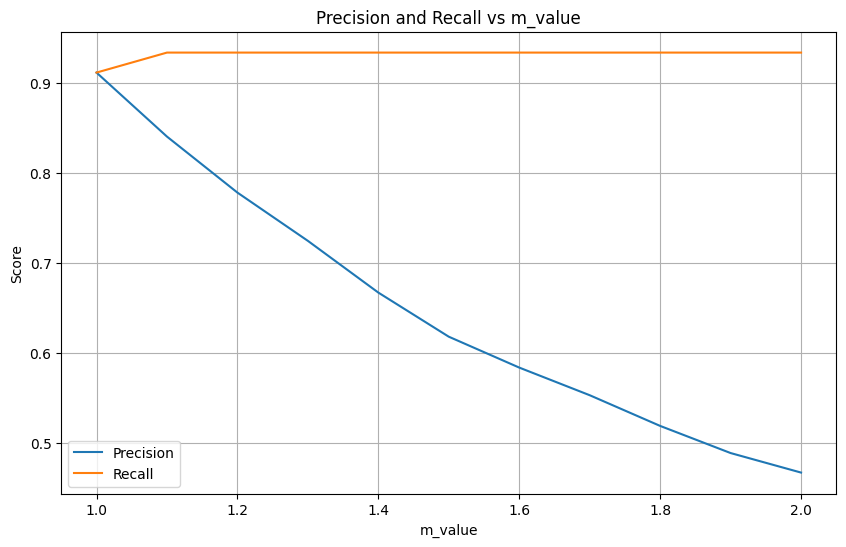

Hid_emn_bas_act_binned
10 ANOMALIES


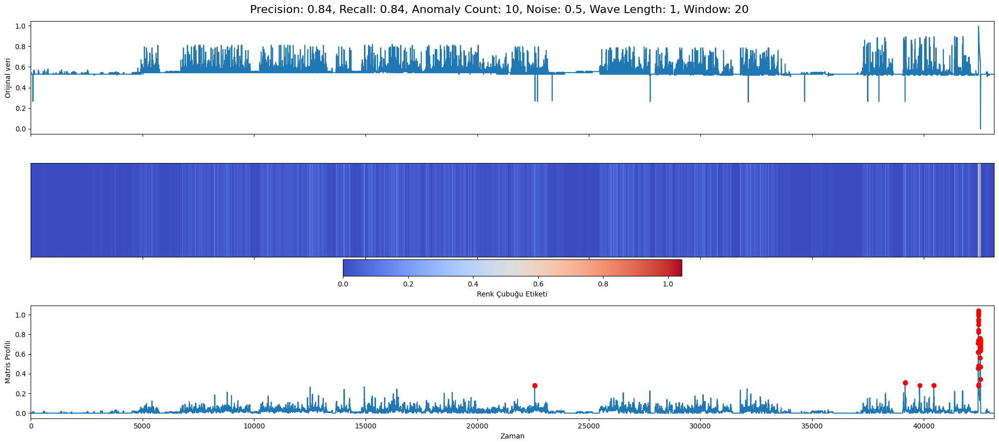

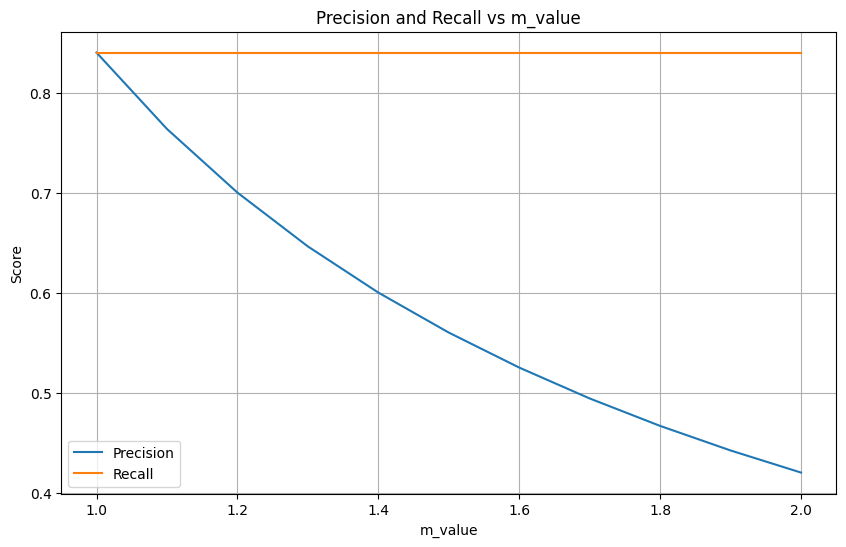

Hid_emn_bas_act_binned
1 ANOMALIES


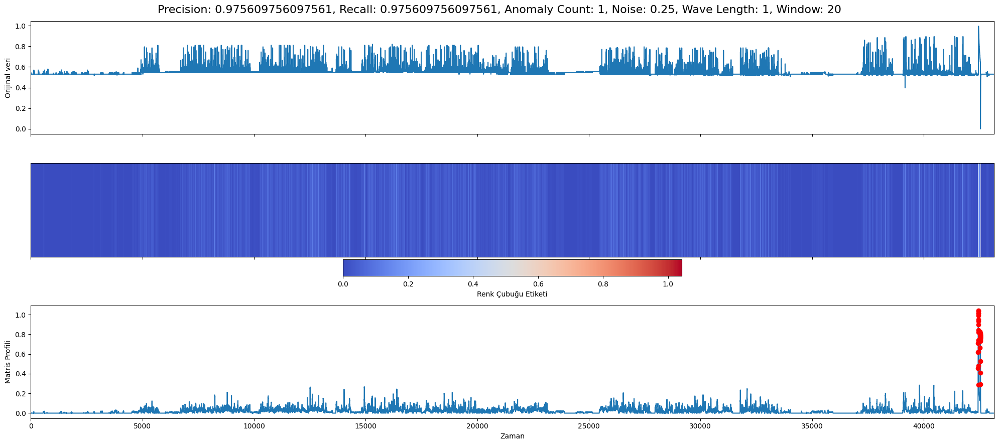

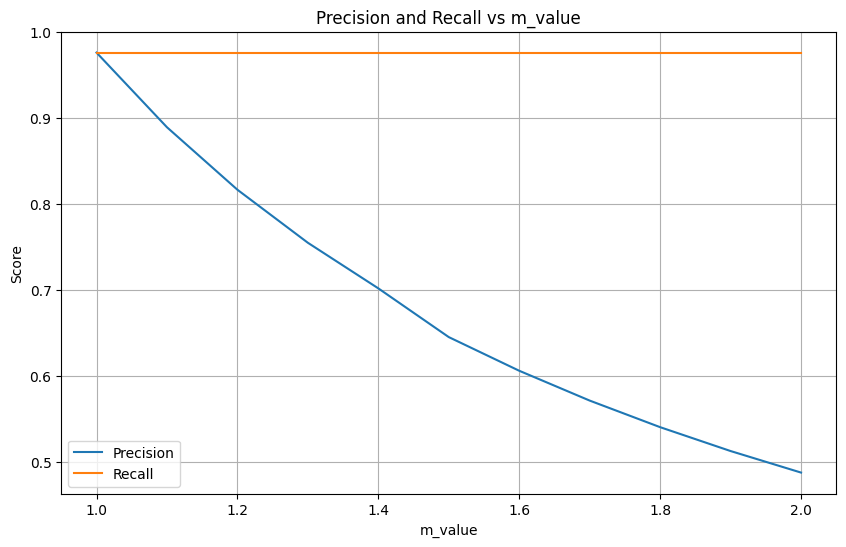

Hid_emn_bas_act_binned
5 ANOMALIES


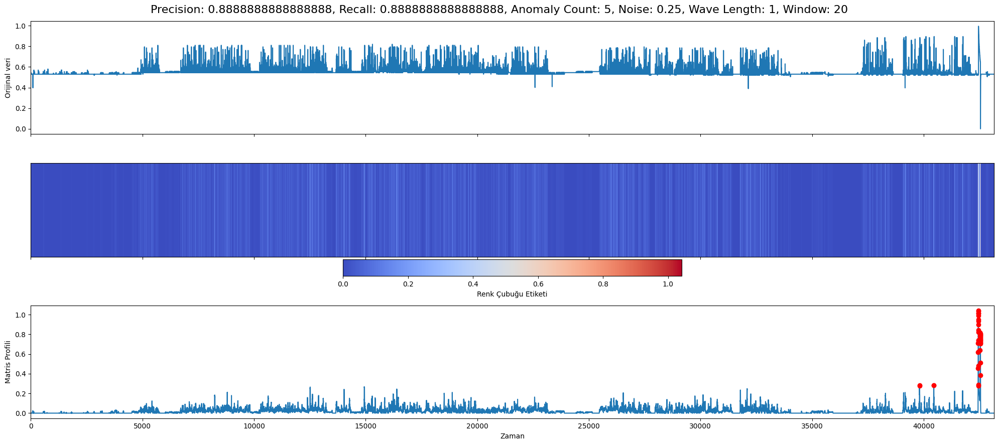

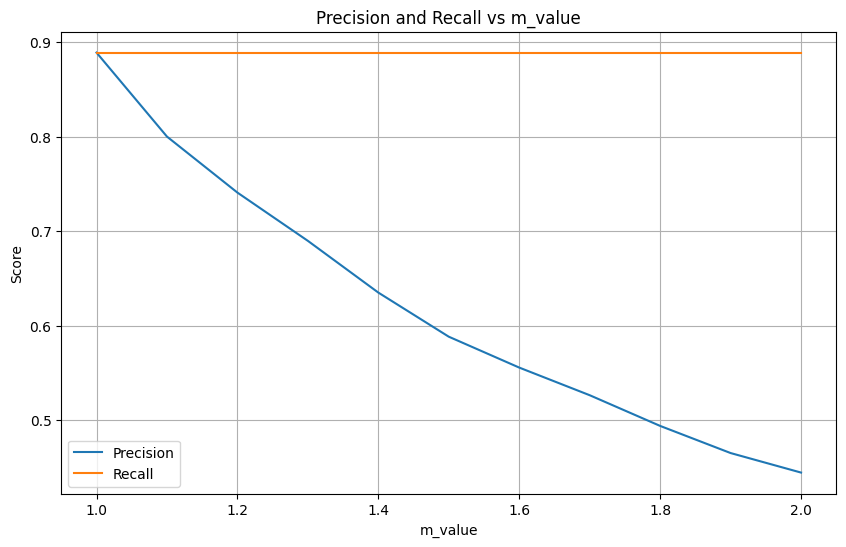

Hid_emn_bas_act_binned
10 ANOMALIES


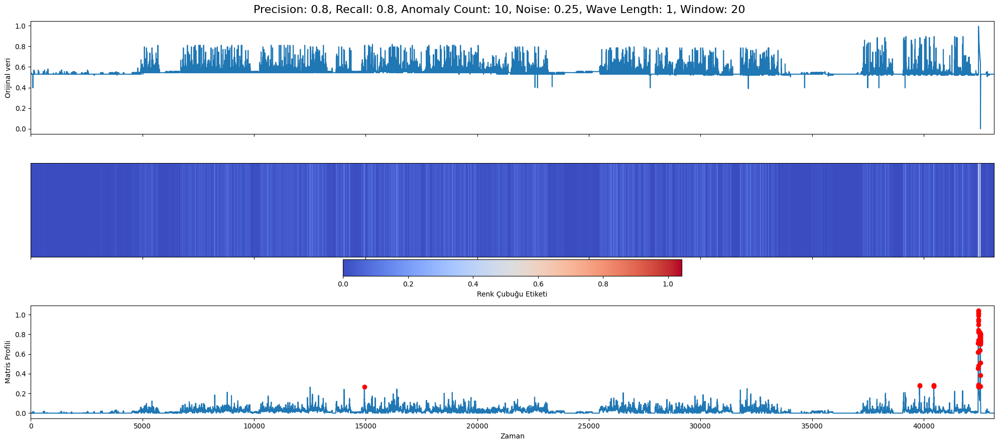

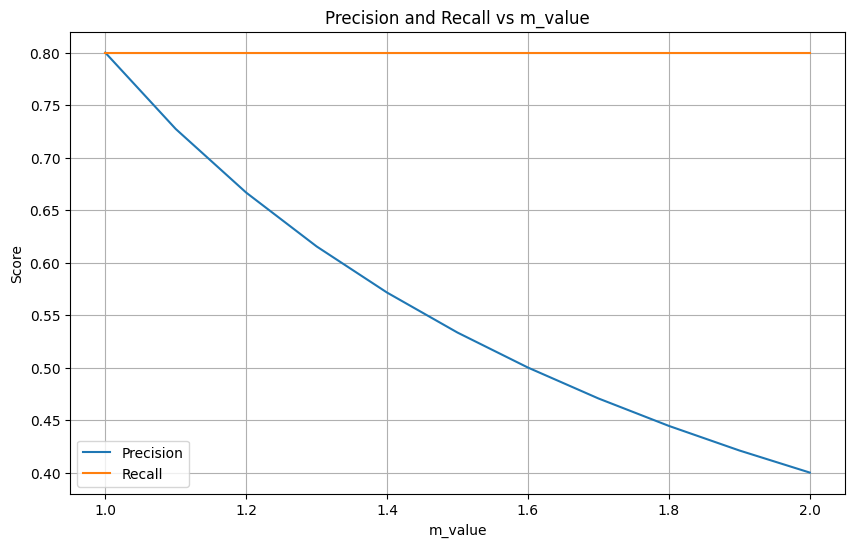

Hid_emn_bas_act_binned
1 ANOMALIES


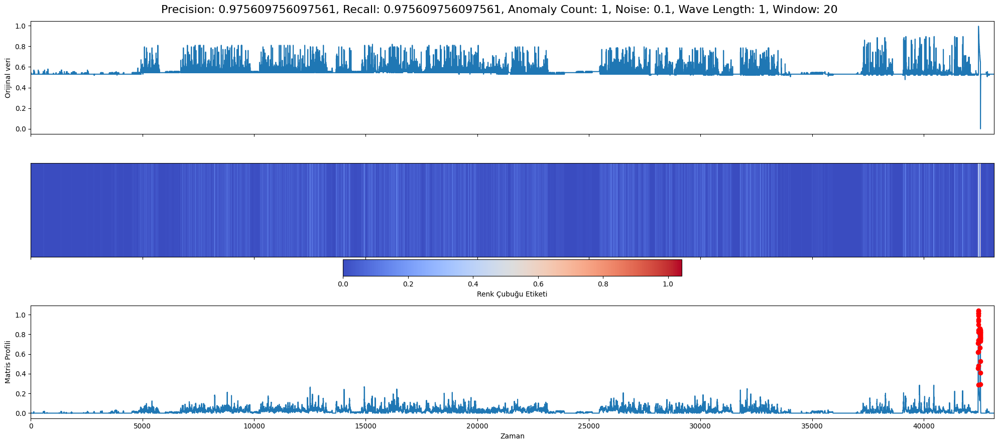

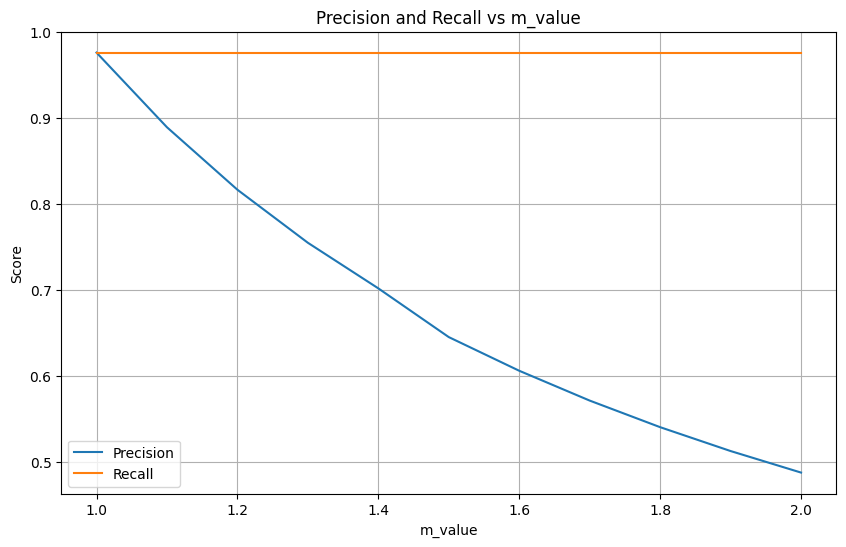

Hid_emn_bas_act_binned
5 ANOMALIES


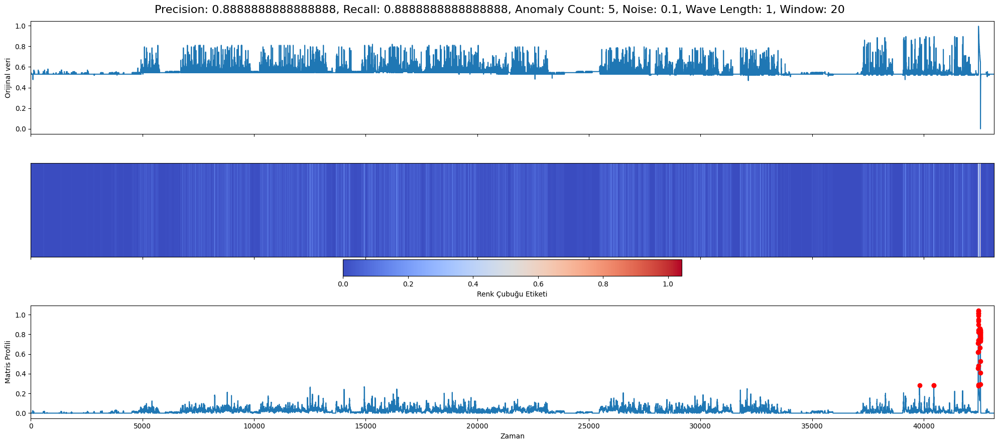

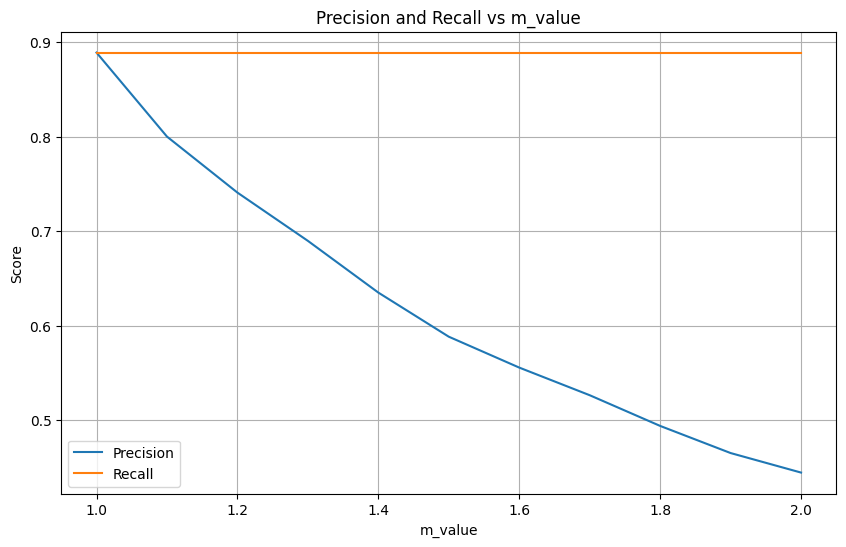

Hid_emn_bas_act_binned
10 ANOMALIES


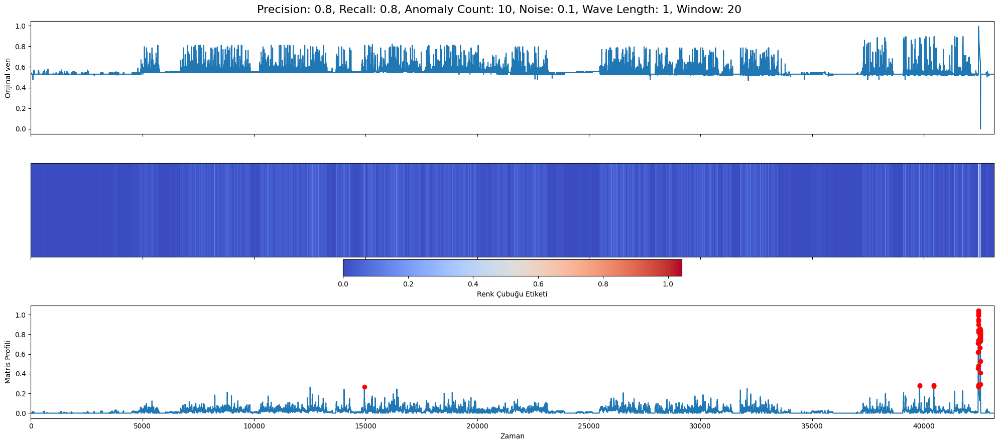

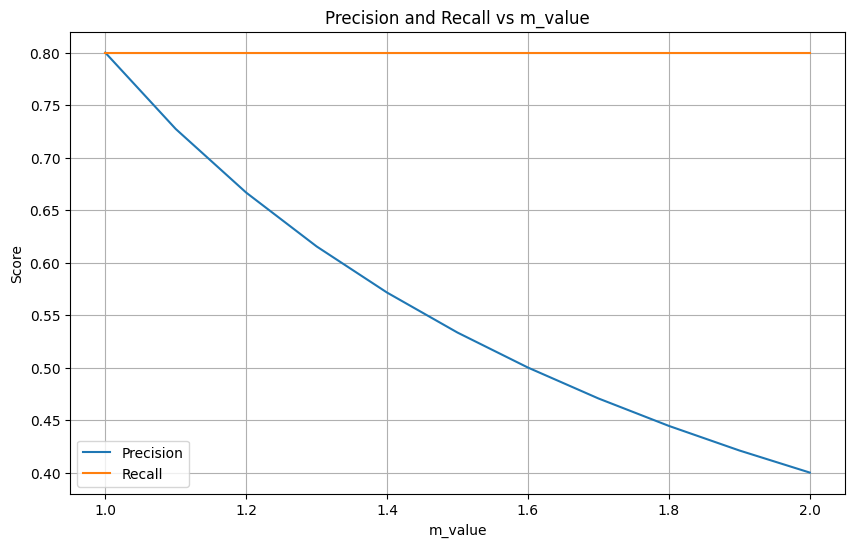

Hid_emn_bas_act_binned
1 ANOMALIES


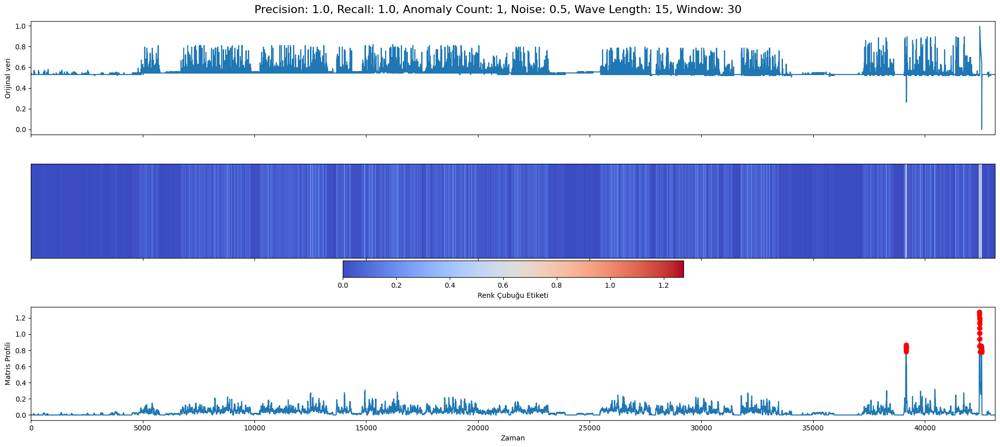

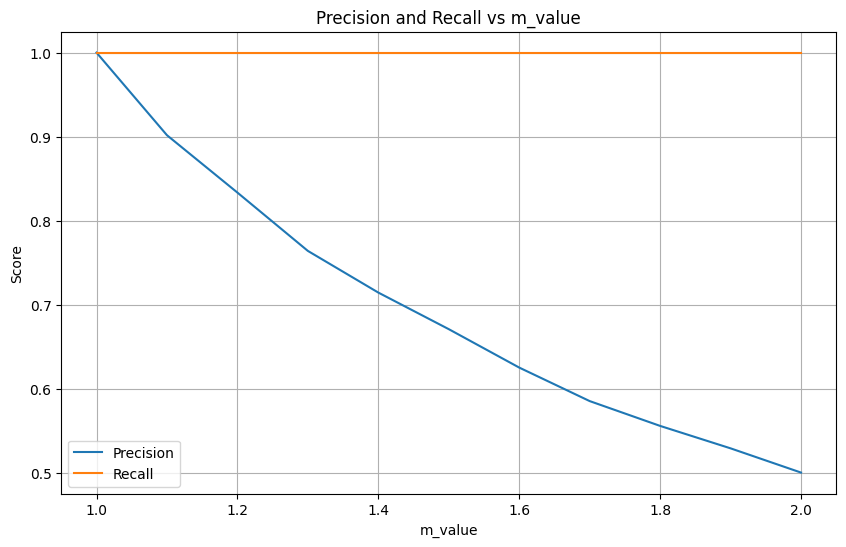

Hid_emn_bas_act_binned
5 ANOMALIES


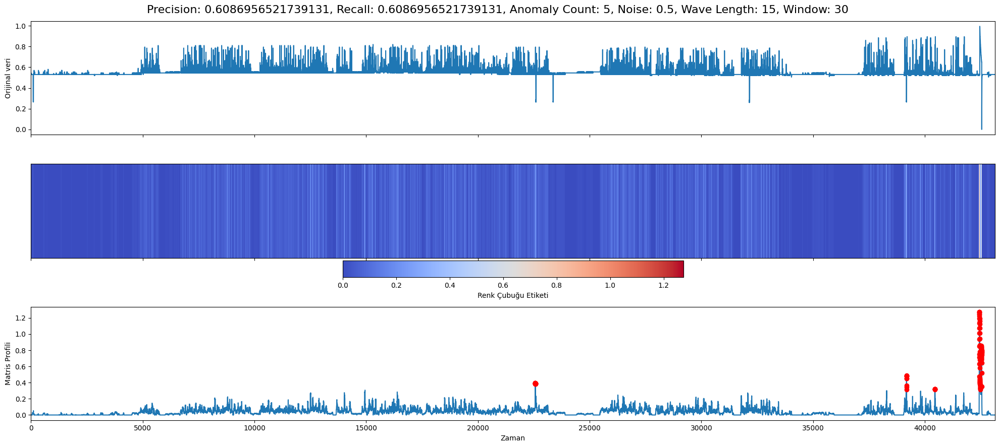

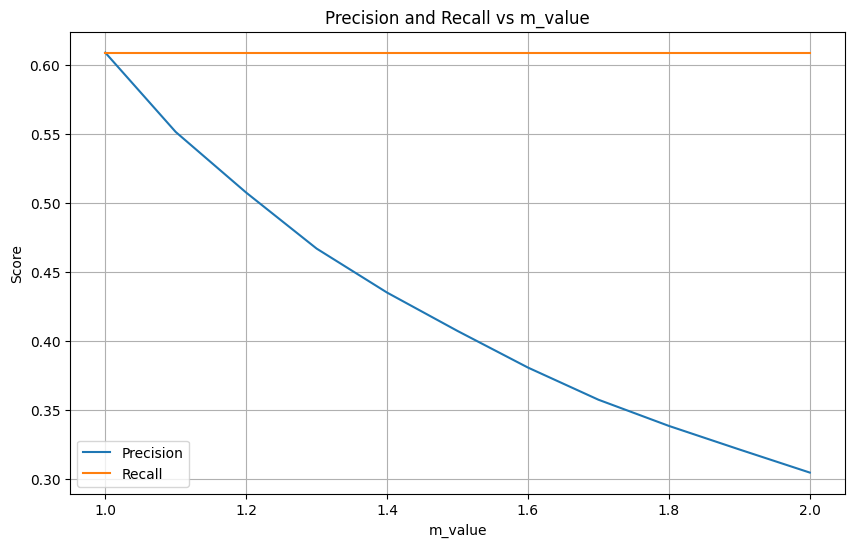

Hid_emn_bas_act_binned
10 ANOMALIES


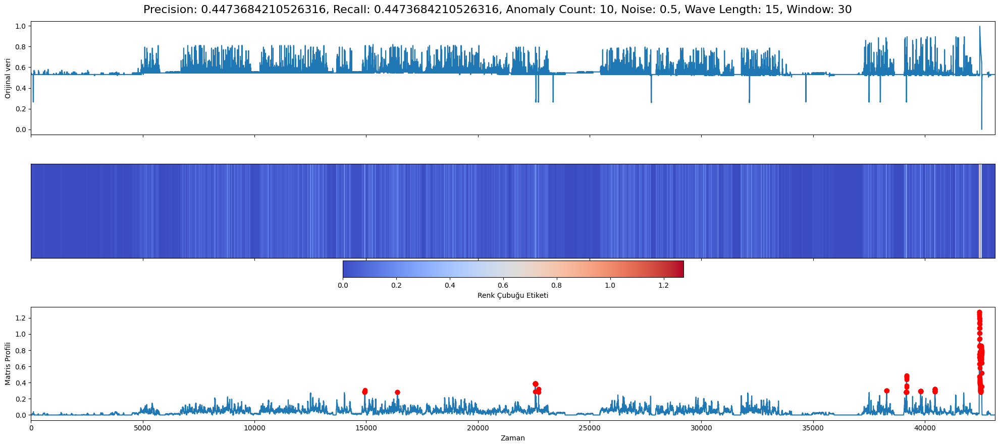

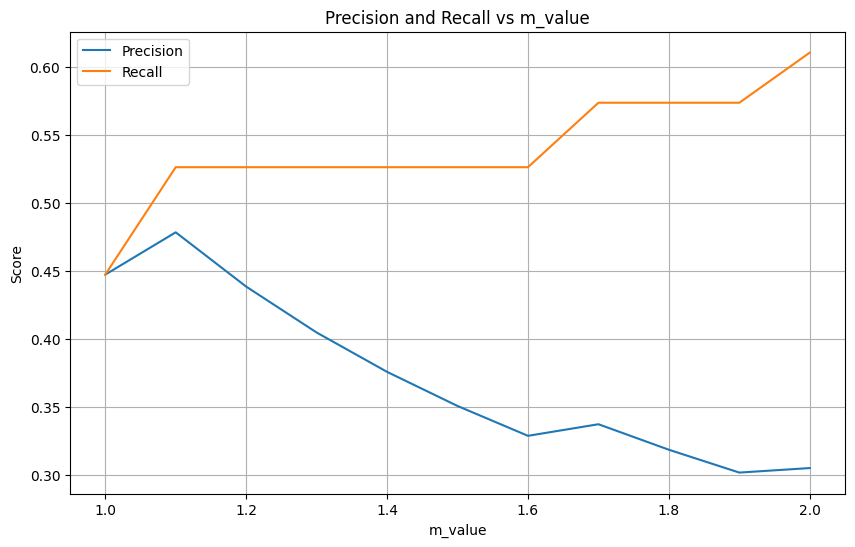

Hid_emn_bas_act_binned
1 ANOMALIES


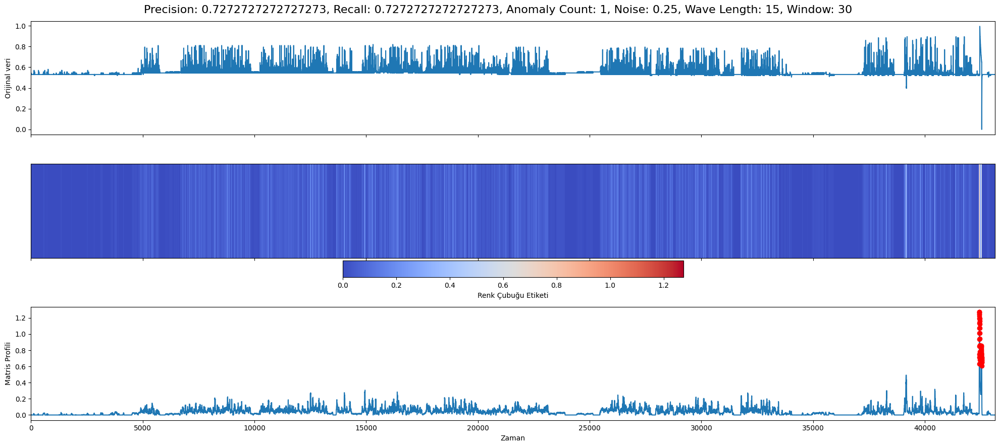

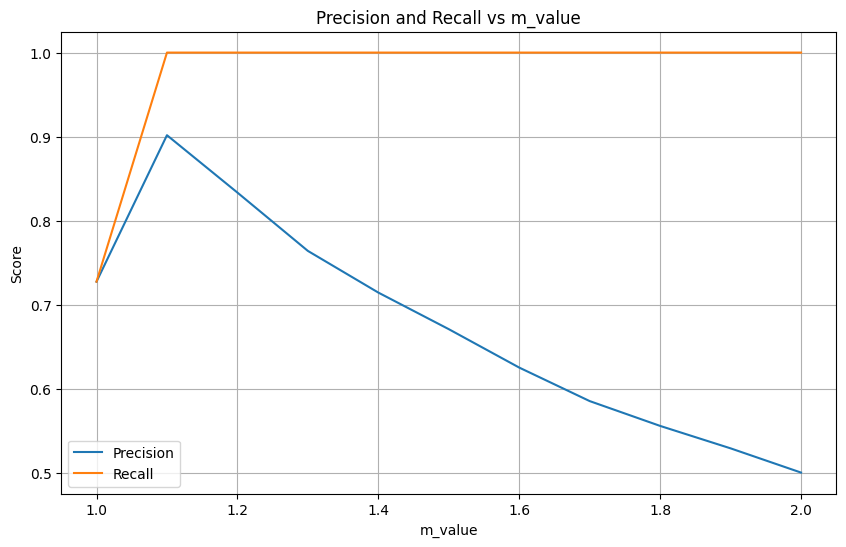

Hid_emn_bas_act_binned
5 ANOMALIES


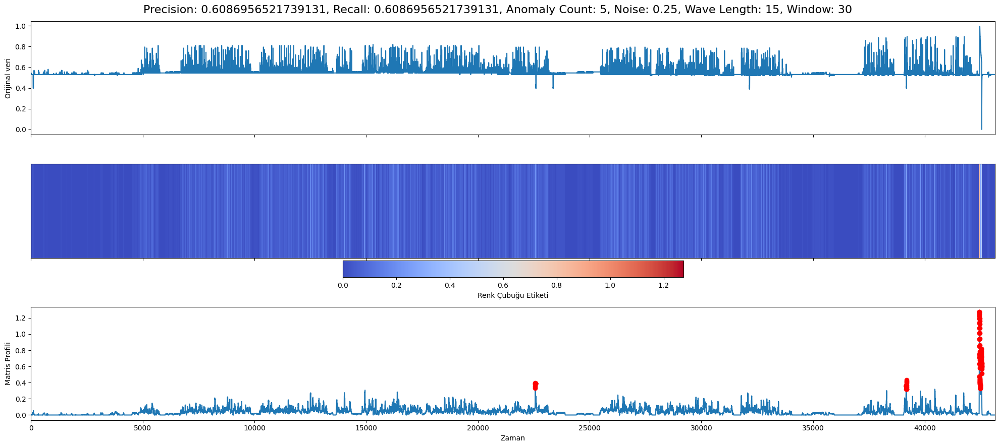

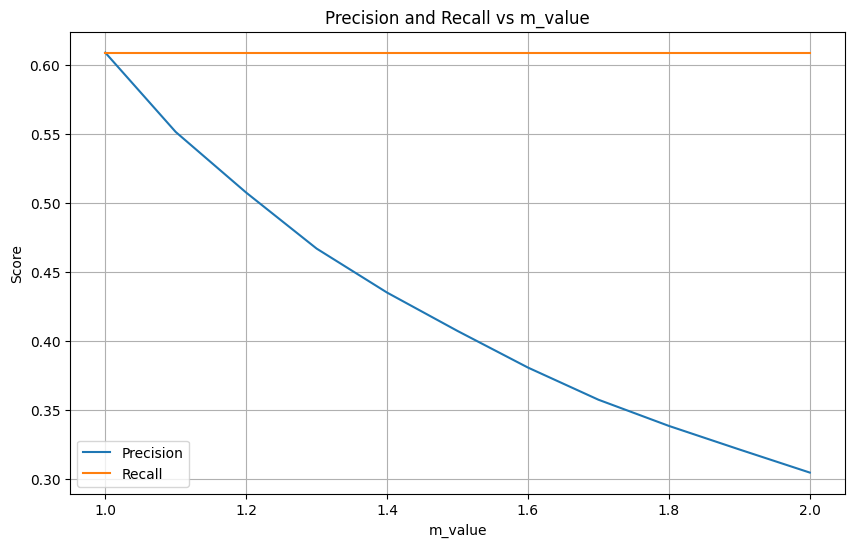

Hid_emn_bas_act_binned
10 ANOMALIES


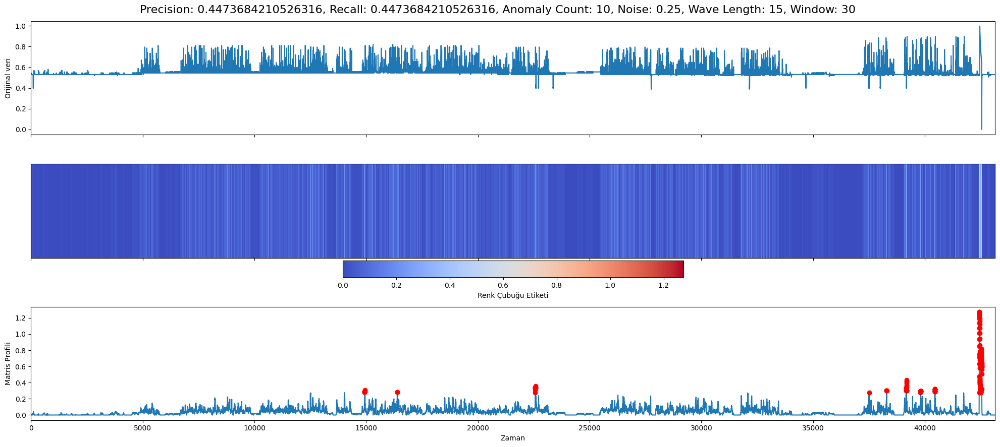

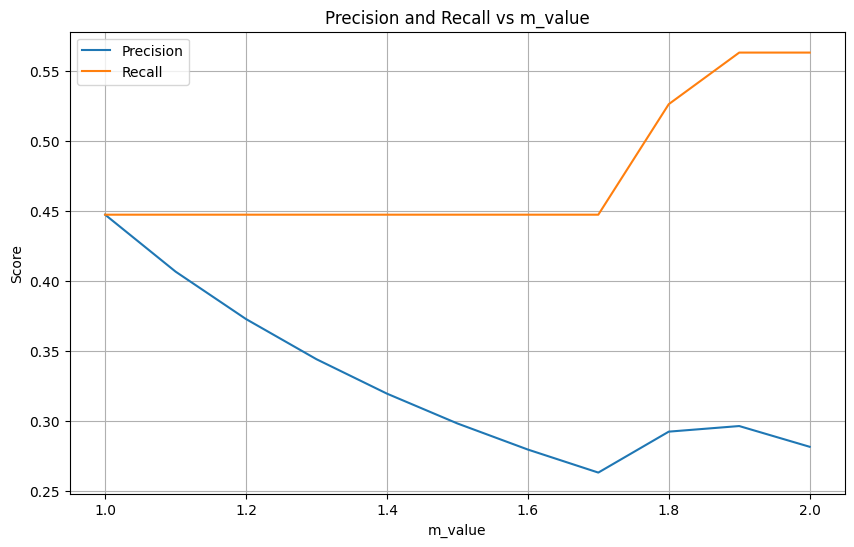

Hid_emn_bas_act_binned
1 ANOMALIES


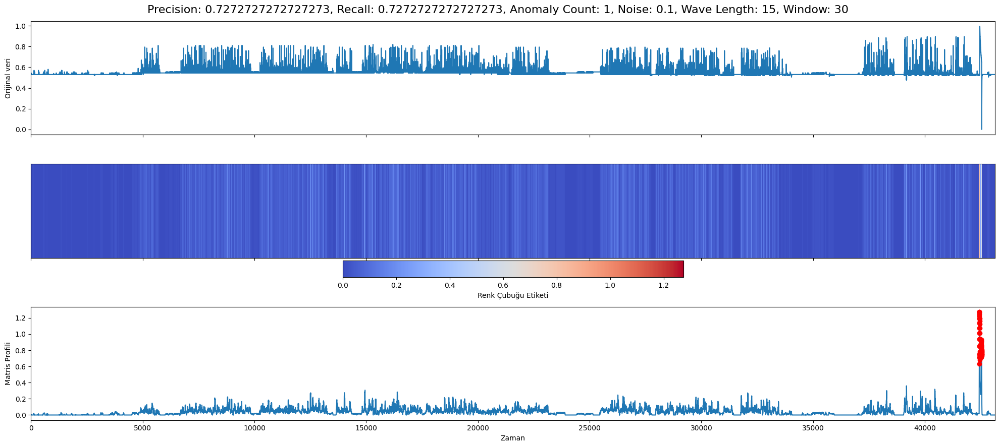

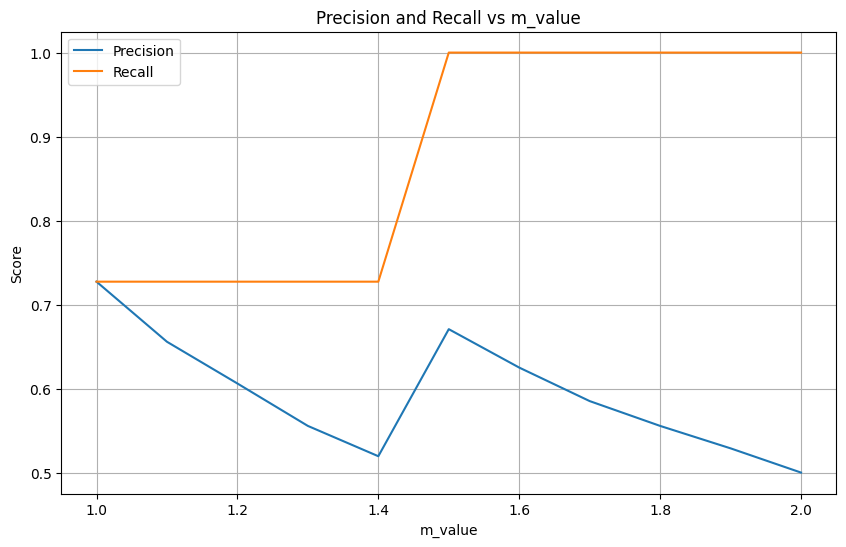

Hid_emn_bas_act_binned
5 ANOMALIES


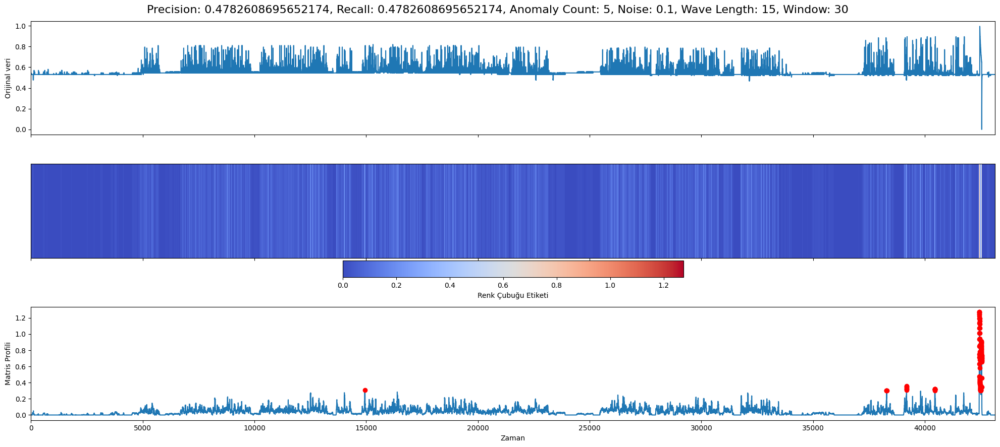

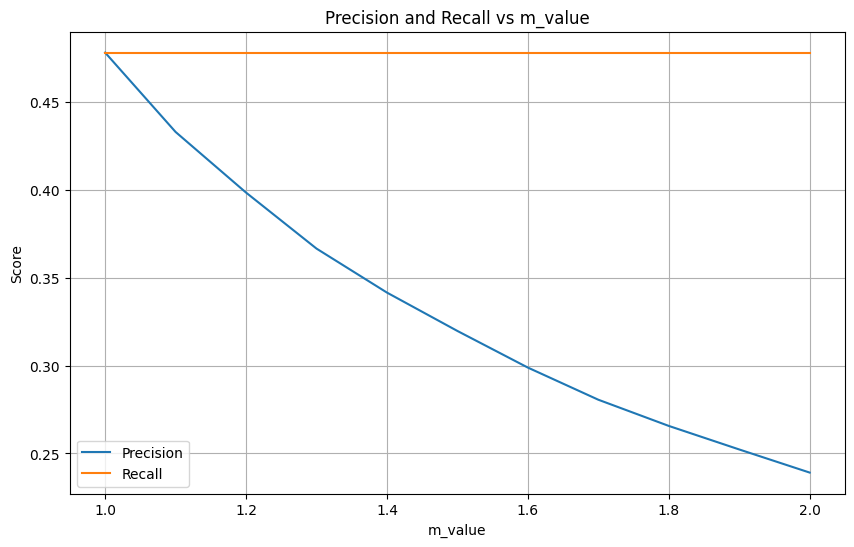

Hid_emn_bas_act_binned
10 ANOMALIES


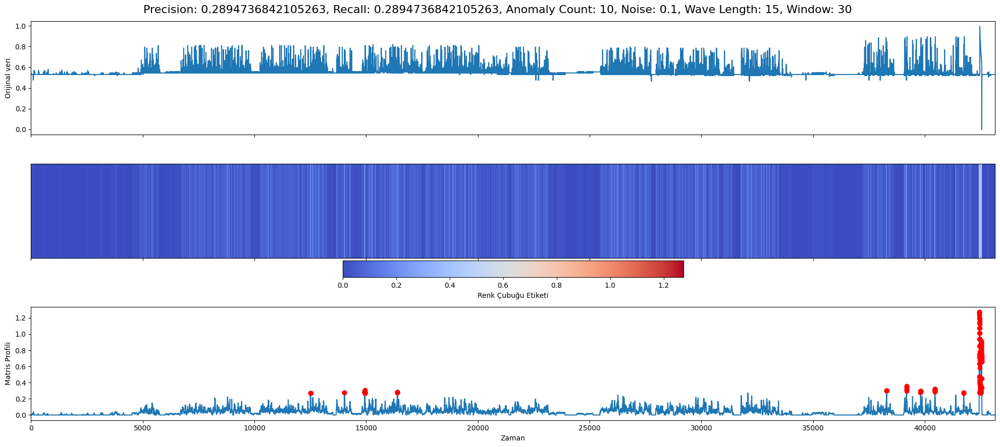

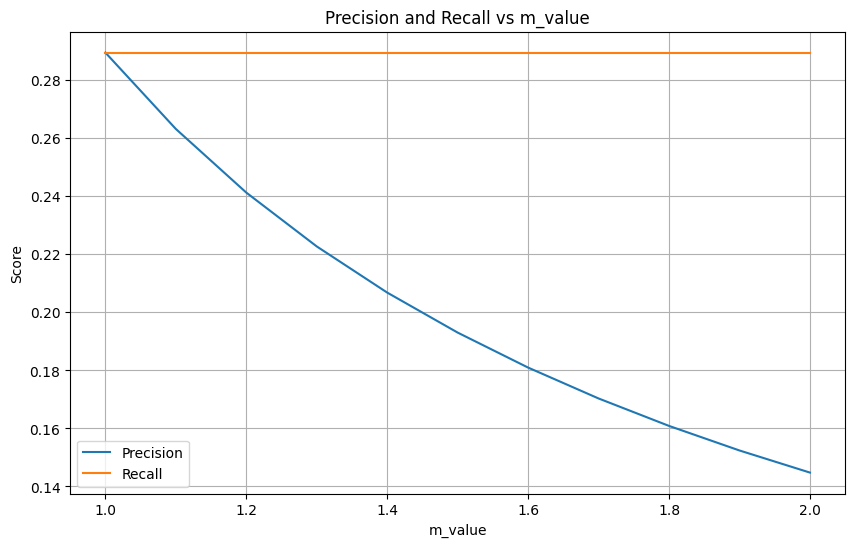

Hid_emn_bas_act_binned
1 ANOMALIES


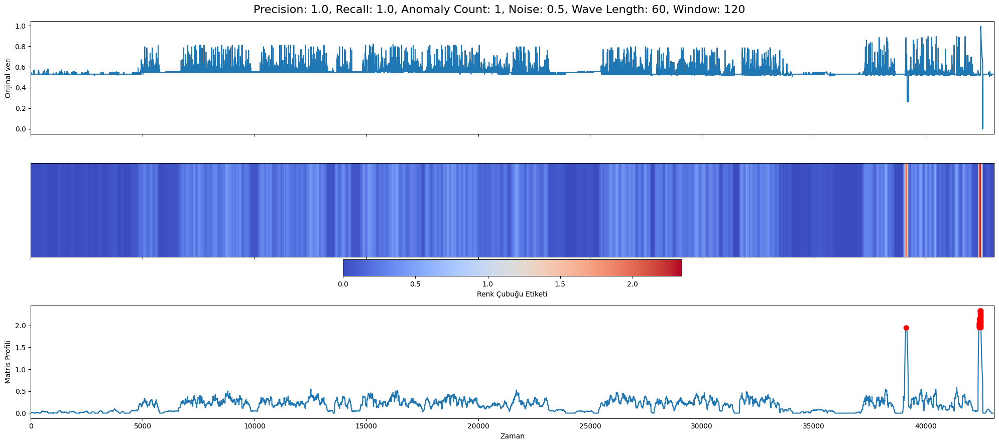

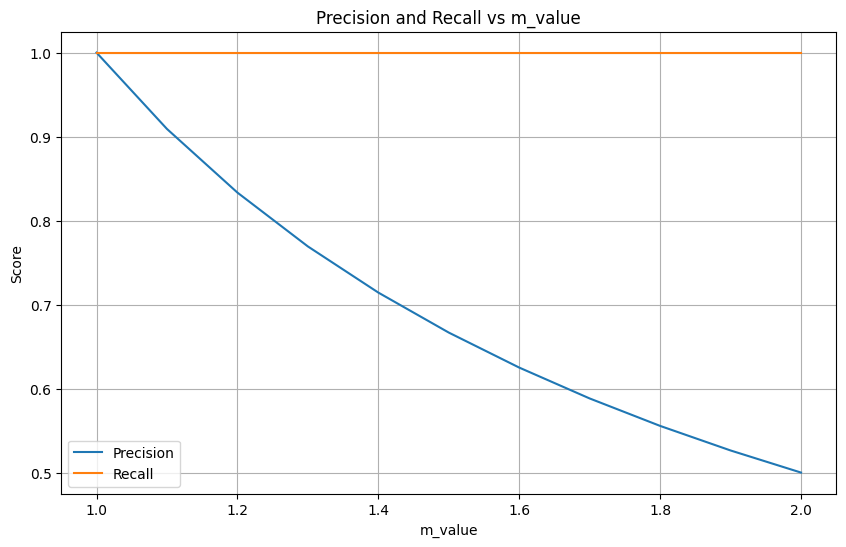

Hid_emn_bas_act_binned
5 ANOMALIES


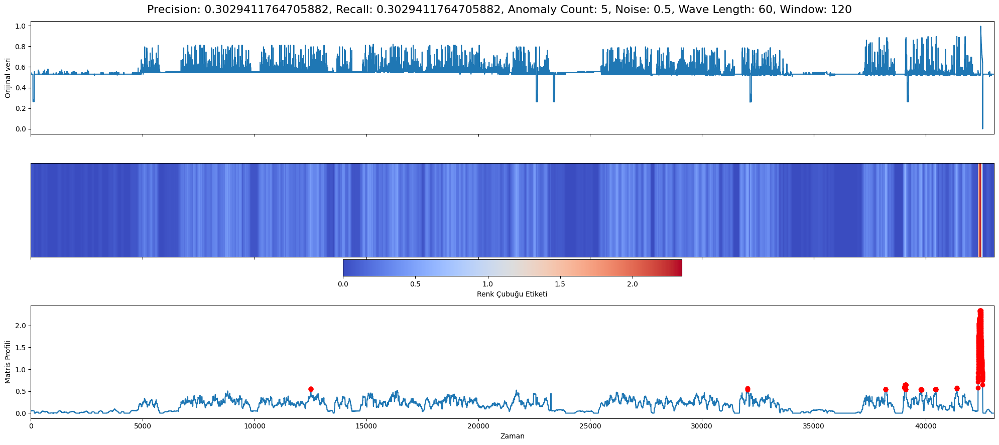

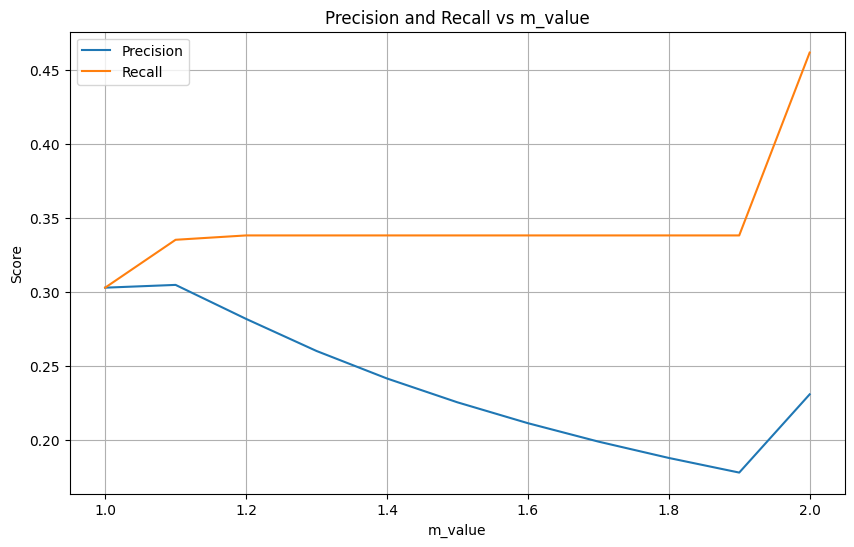

Hid_emn_bas_act_binned
10 ANOMALIES


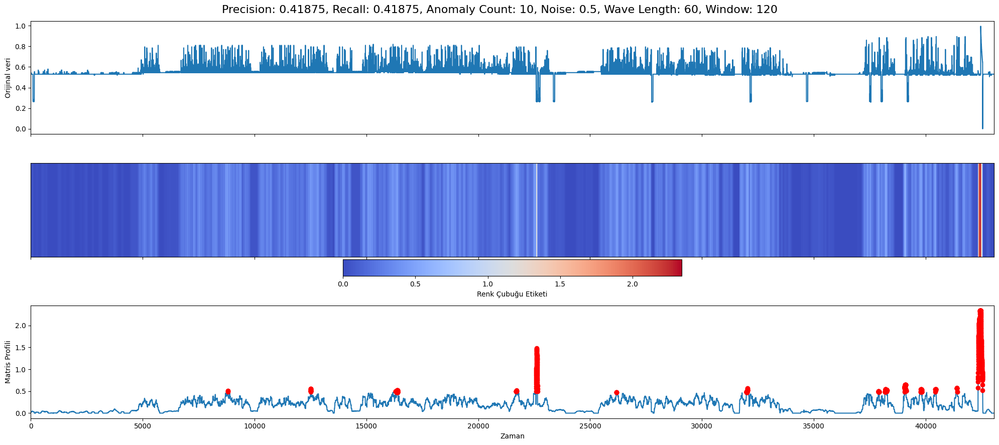

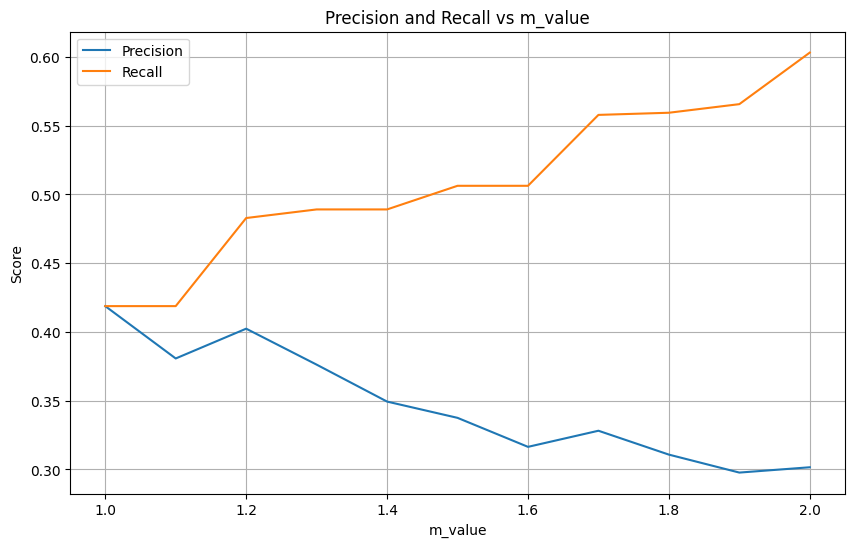

Hid_emn_bas_act_binned
1 ANOMALIES


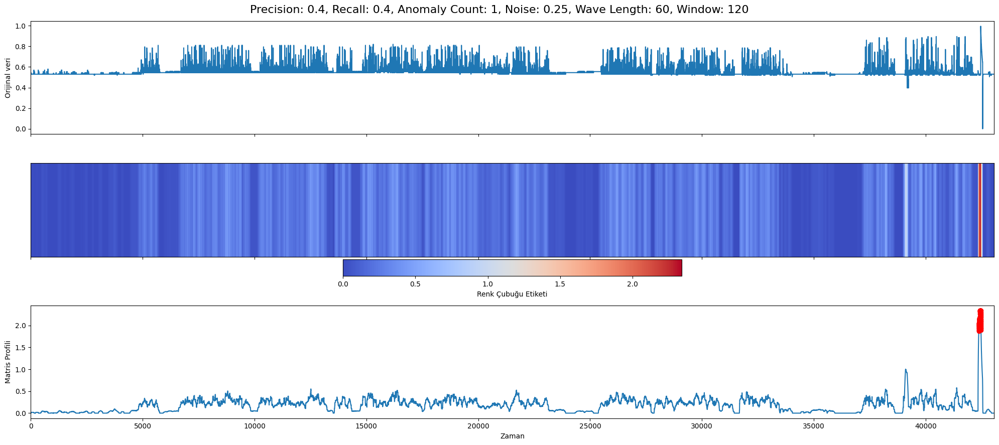

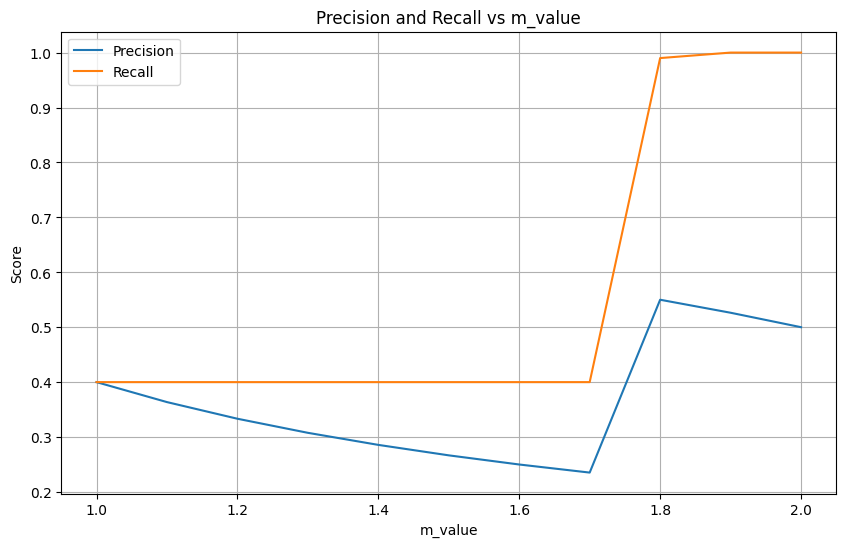

Hid_emn_bas_act_binned
5 ANOMALIES


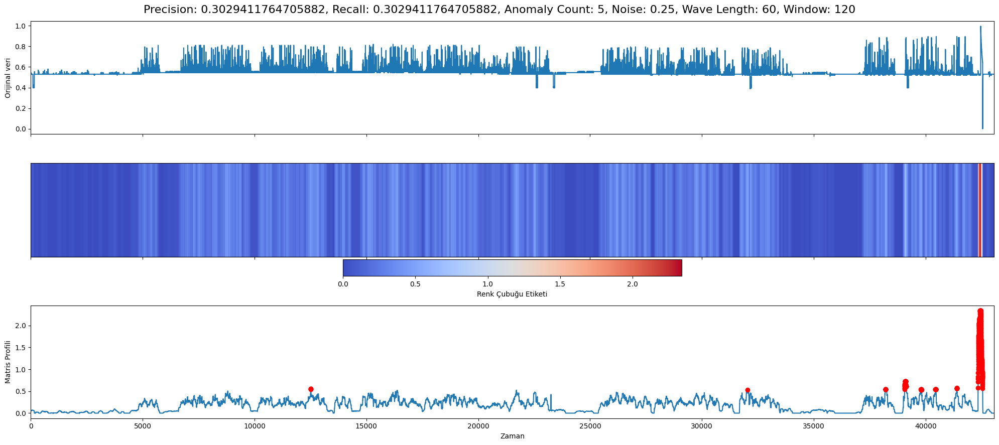

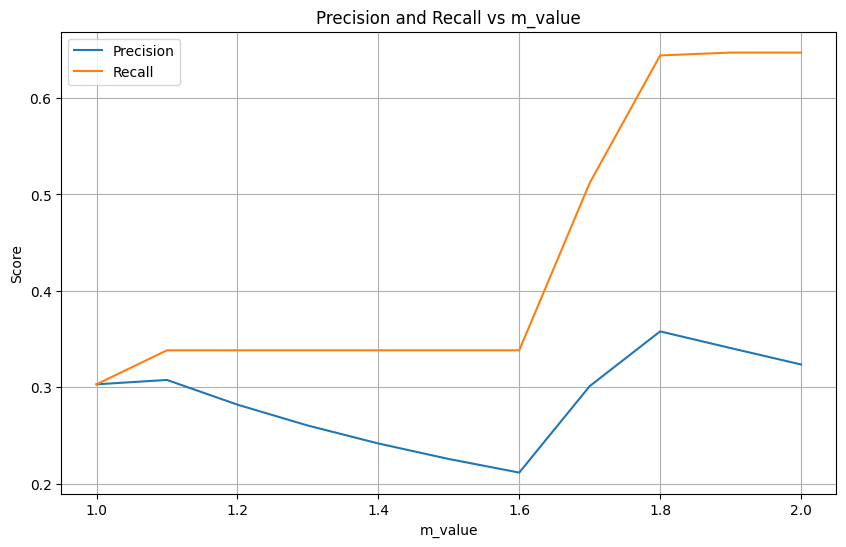

Hid_emn_bas_act_binned
10 ANOMALIES


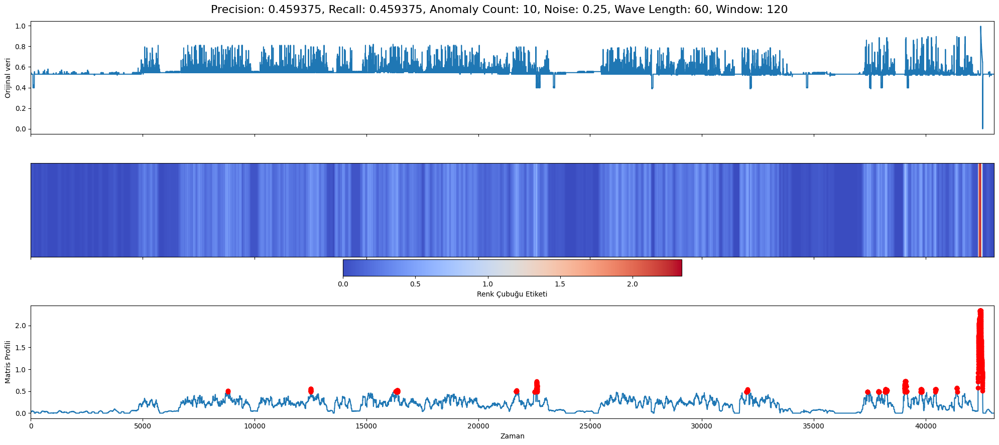

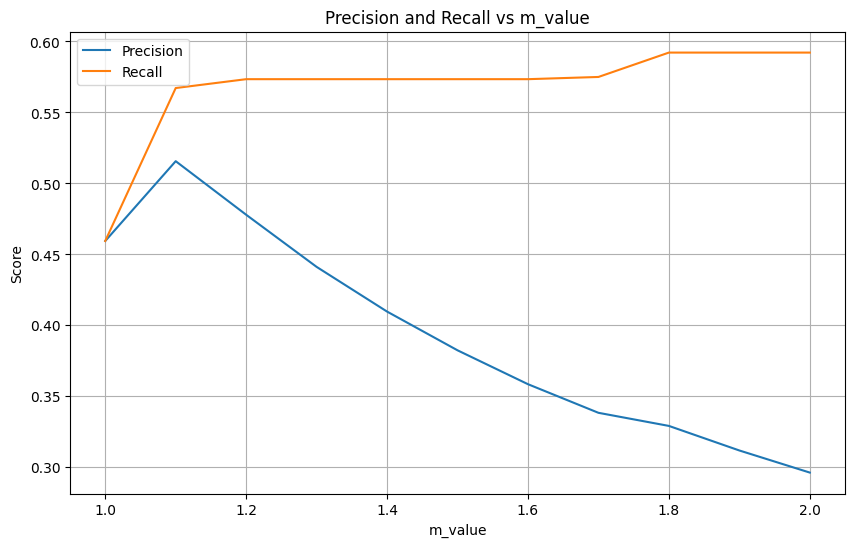

Hid_emn_bas_act_binned
1 ANOMALIES


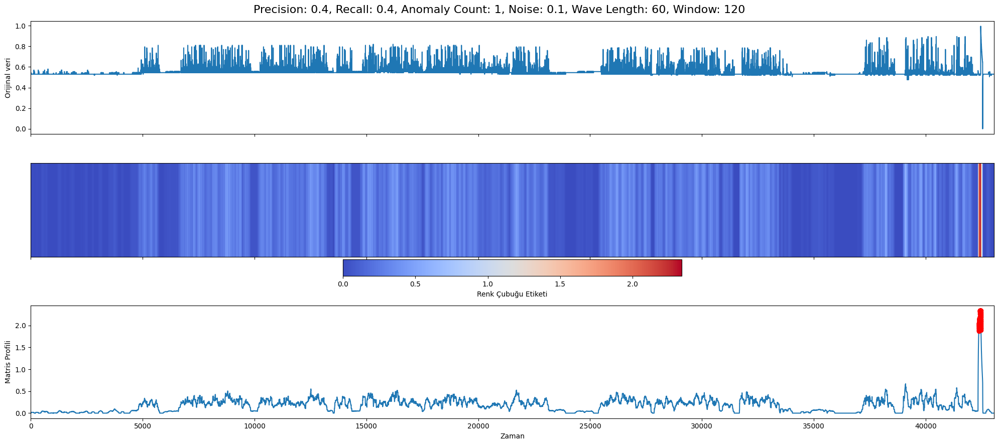

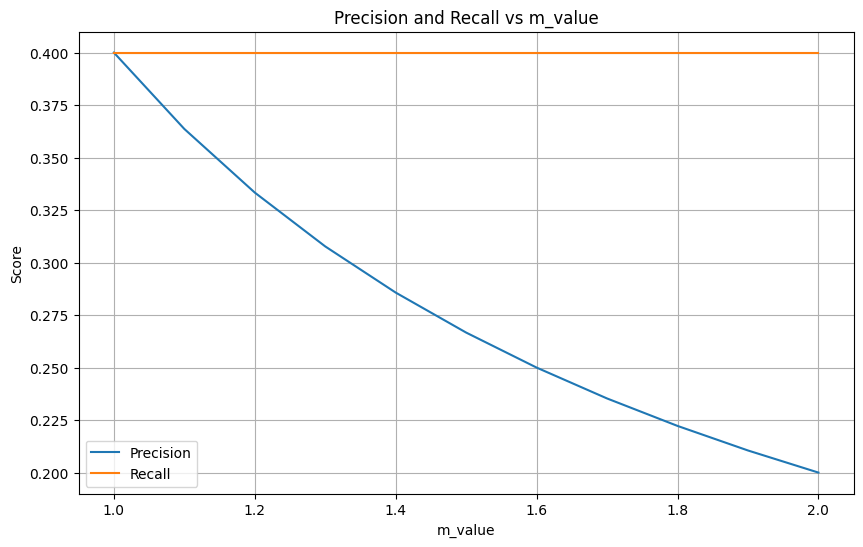

Hid_emn_bas_act_binned
5 ANOMALIES


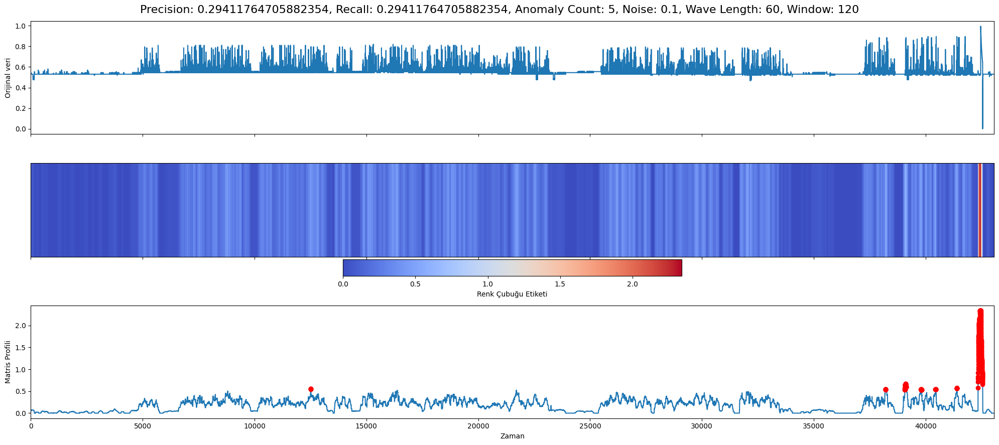

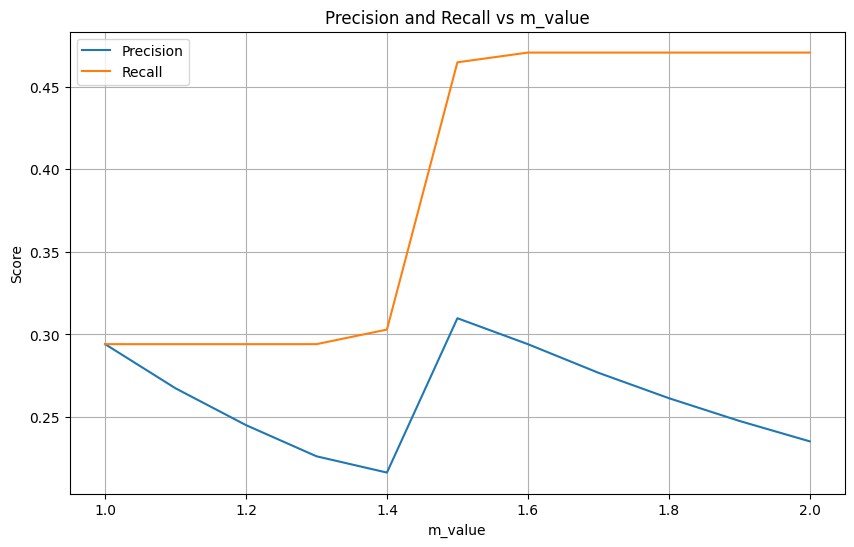

Hid_emn_bas_act_binned
10 ANOMALIES


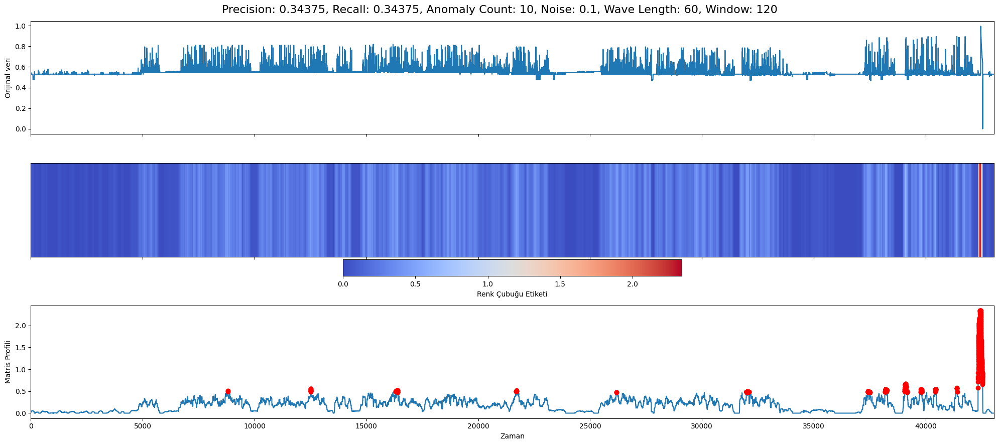

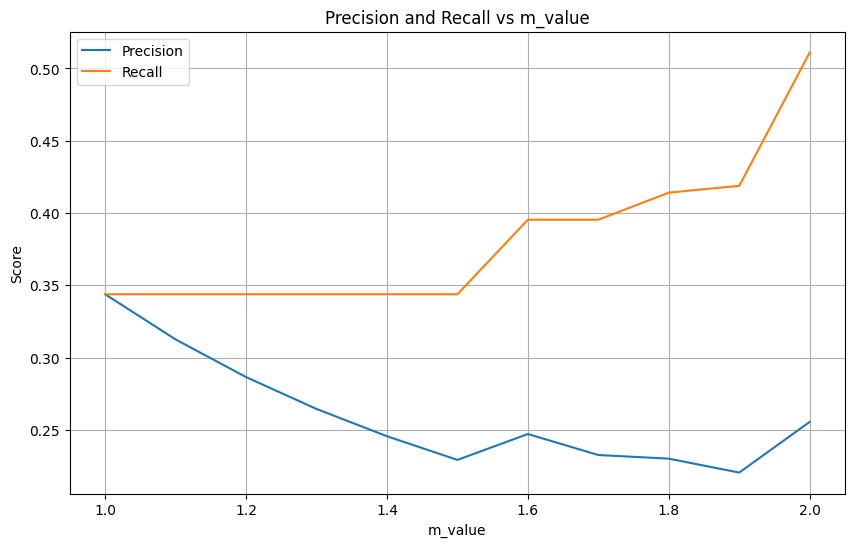

In [23]:
for wave_length in wave_lengths:
    for noise in noises:
        for anomaly_count in anomaly_counts:
            anomaly_normal_ratio = anomaly_normal_ratios[anomaly_count]
            df_results2 = get_results2(df1, anomaly_normal_ratio, anomaly_count, wave_length, noise, df_results2)
            

In [26]:
df_results2

,data,noise,anomaly count,wave len,window,precision,recall,anomaly_normal_ratio,noise direction,m
0,77,0.5,1,1,20,1.000000,1.000000,0.000025,n,1.0
1,77,0.5,1,1,20,0.911111,1.000000,0.000025,n,1.1
2,77,0.5,1,1,20,0.836735,1.000000,0.000025,n,1.2
3,77,0.5,1,1,20,0.773585,1.000000,0.000025,n,1.3
4,77,0.5,1,1,20,0.719298,1.000000,0.000025,n,1.4
...,...,...,...,...,...,...,...,...,...,...
292,77,0.1,10,60,120,0.247070,0.395313,0.000240,n,1.6
293,77,0.1,10,60,120,0.232537,0.395313,0.000240,n,1.7
294,77,0.1,10,60,120,0.230035,0.414062,0.000240,n,1.8
295,77,0.1,10,60,120,0.220395,0.418750,0.000240,n,1.9


In [25]:
df_results2.to_csv("mp_results.csv", index=False)

In [229]:
df_results.sort_values(['recall', 'precision'], ascending=[False, False])

,data,noise,anomaly count,wave len,window,precision,recall,anomaly_normal_ratio,noise direction
18,77,0.50,1,60,120,0.312500,1.000000,0.000025,n
9,77,0.50,1,15,30,0.277778,1.000000,0.000025,n
21,77,0.25,1,60,120,0.247934,1.000000,0.000025,n
24,77,0.10,1,60,120,0.226415,1.000000,0.000025,n
12,77,0.25,1,15,30,0.211268,1.000000,0.000025,n
0,77,0.50,1,1,20,0.025000,1.000000,0.000025,n
19,77,0.50,5,60,120,0.175593,0.666667,0.000130,n
22,77,0.25,5,60,120,0.173244,0.600000,0.000130,n
23,77,0.25,10,60,120,0.168856,0.600000,0.000240,n
25,77,0.10,5,60,120,0.152211,0.596667,0.000130,n


Hid_emn_bas_act_binned
1 ANOMALIES


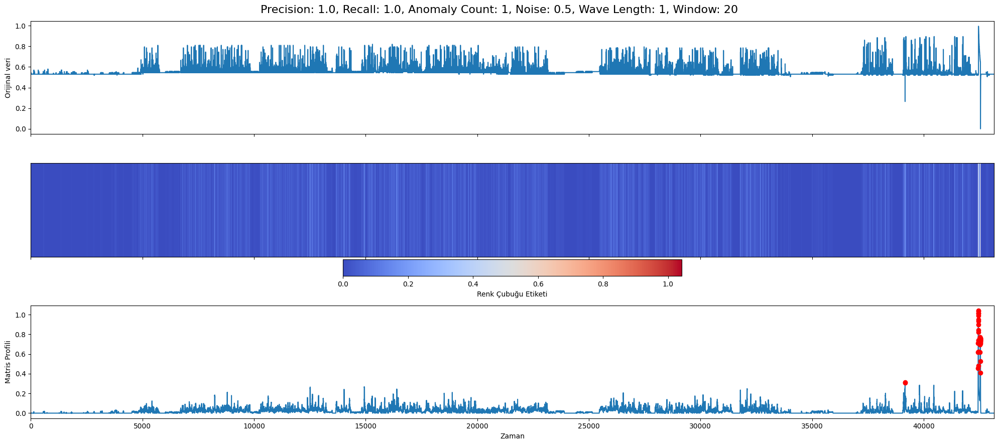

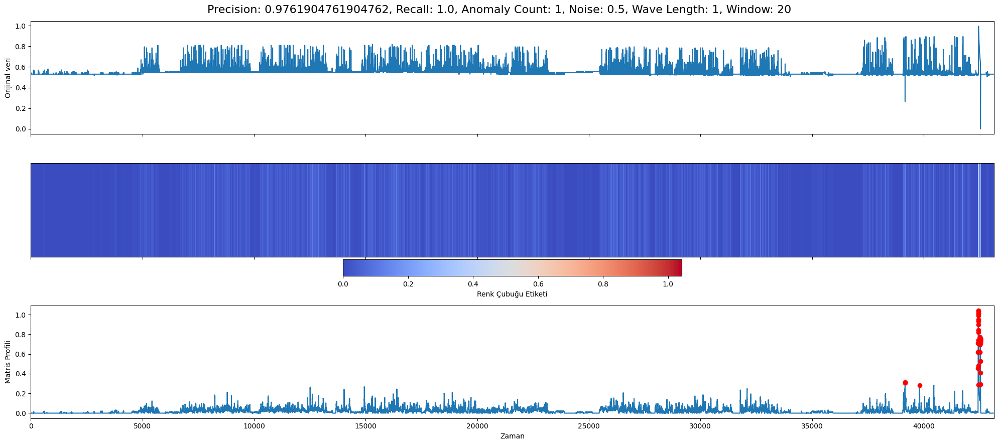

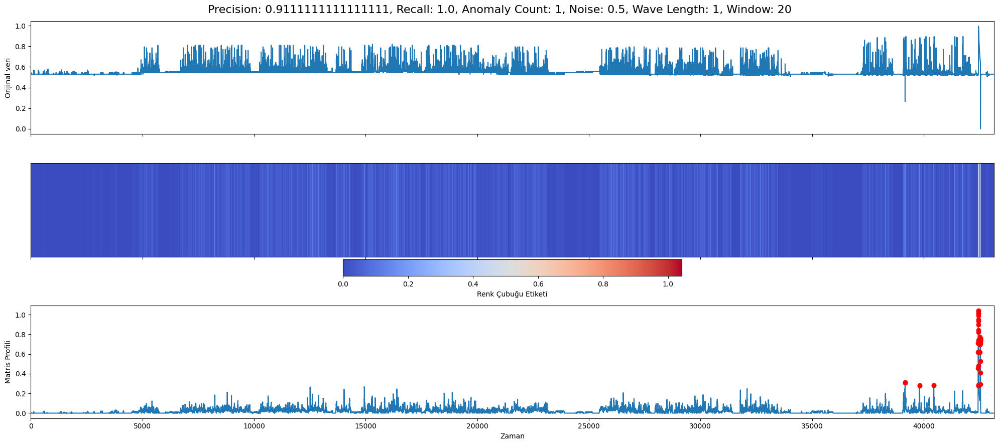

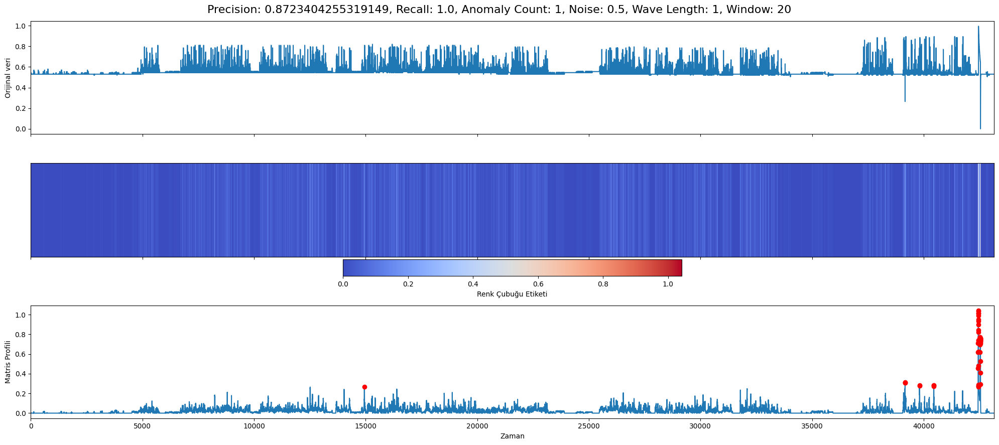

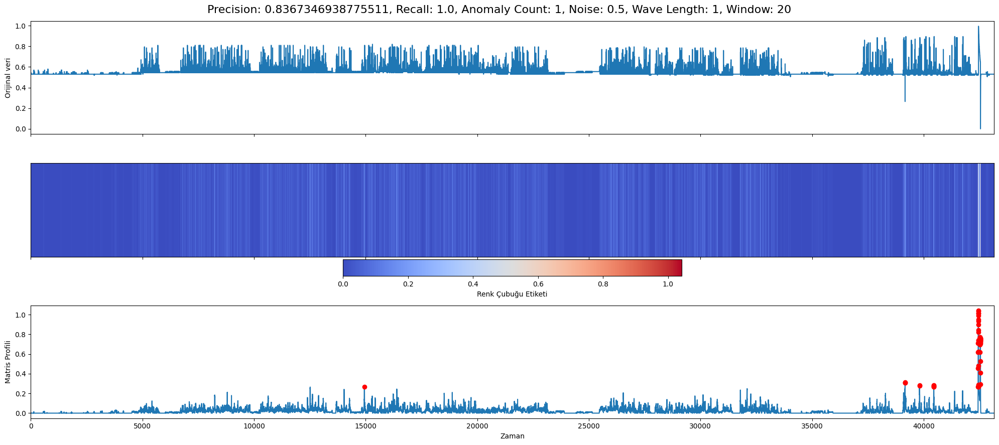

...

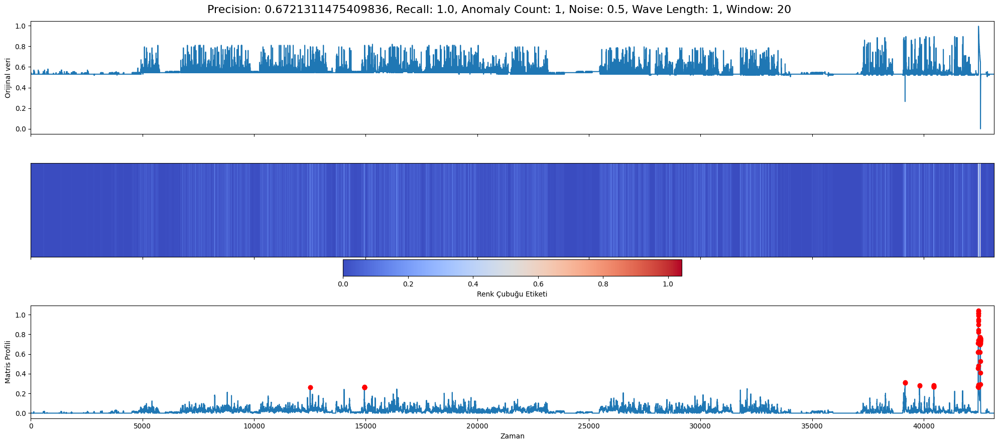

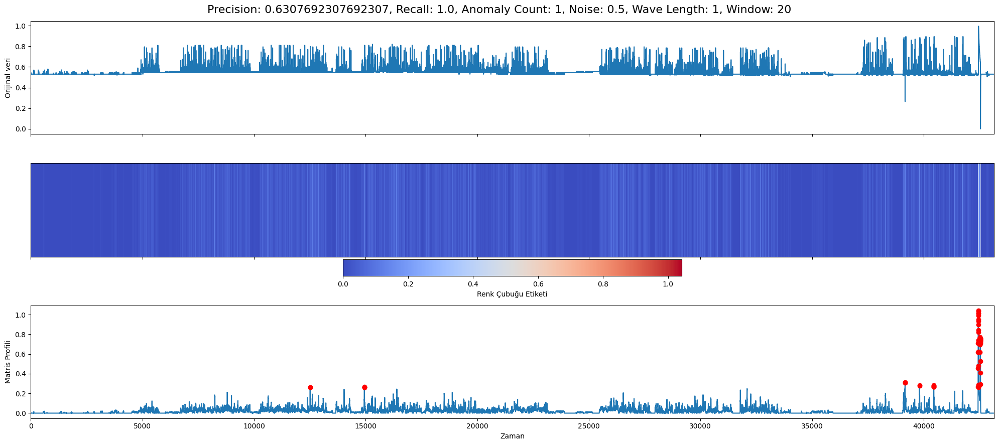

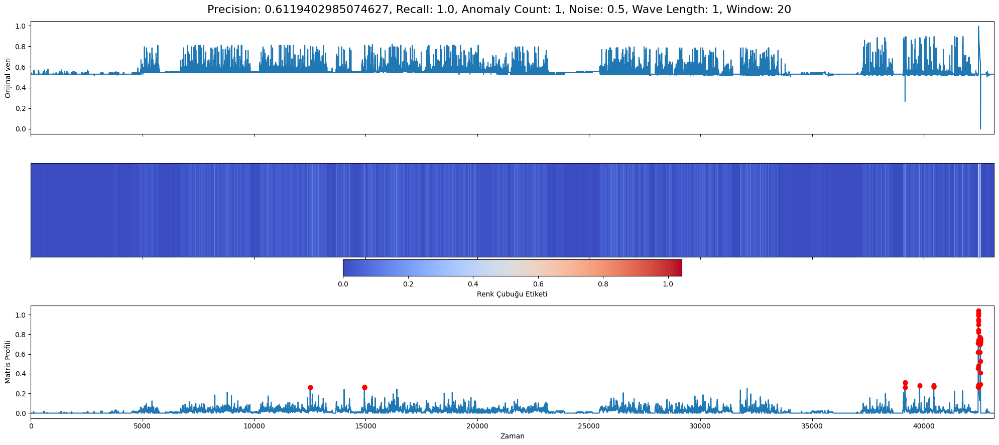

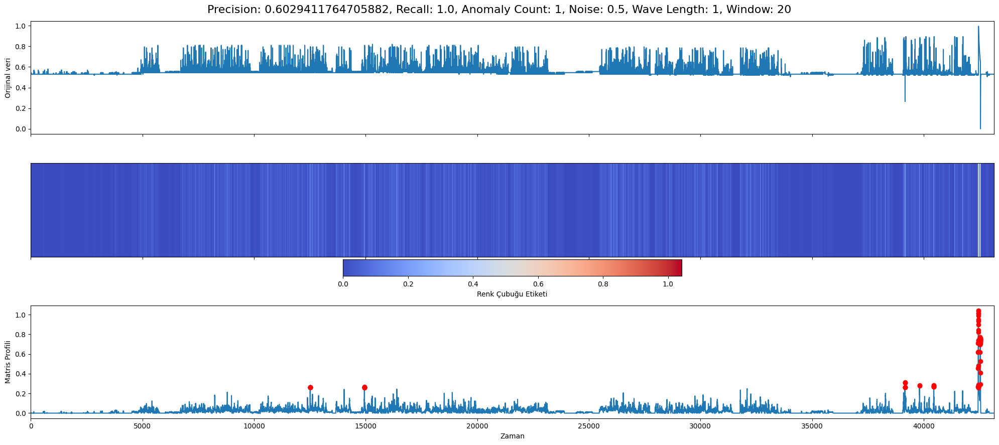

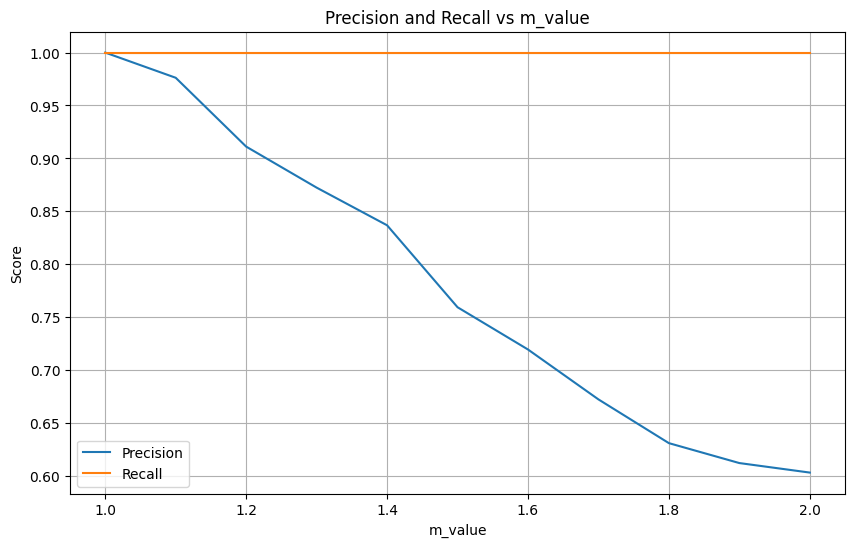

,data,noise,anomaly count,wave len,window,precision,recall,anomaly_normal_ratio,noise direction,m
0,77,0.10,10,60,120,0.465116,0.343750,0.000240,n,1.0
1,77,0.10,10,60,120,0.423892,0.343750,0.000240,n,1.1
2,77,0.10,10,60,120,0.396396,0.343750,0.000240,n,1.2
3,77,0.10,10,60,120,0.360065,0.343750,0.000240,n,1.3
4,77,0.10,10,60,120,0.334347,0.343750,0.000240,n,1.4
5,77,0.10,10,60,120,0.309423,0.343750,0.000240,n,1.5
6,77,0.10,10,60,120,0.317043,0.395313,0.000240,n,1.6
7,77,0.10,10,60,120,0.295561,0.395313,0.000240,n,1.7
8,77,0.10,10,60,120,0.287107,0.414062,0.000240,n,1.8
9,77,0.10,10,60,120,0.272635,0.418750,0.000240,n,1.9


In [90]:

            df_results2 = get_results2(df1, anomaly_normal_ratio, anomaly_count, wave_length, noise, df_results2)


In [108]:
df_results3 = df_results.copy()
df_results3["m"] = 0

Hid_emn_bas_act_binned
5 ANOMALIES


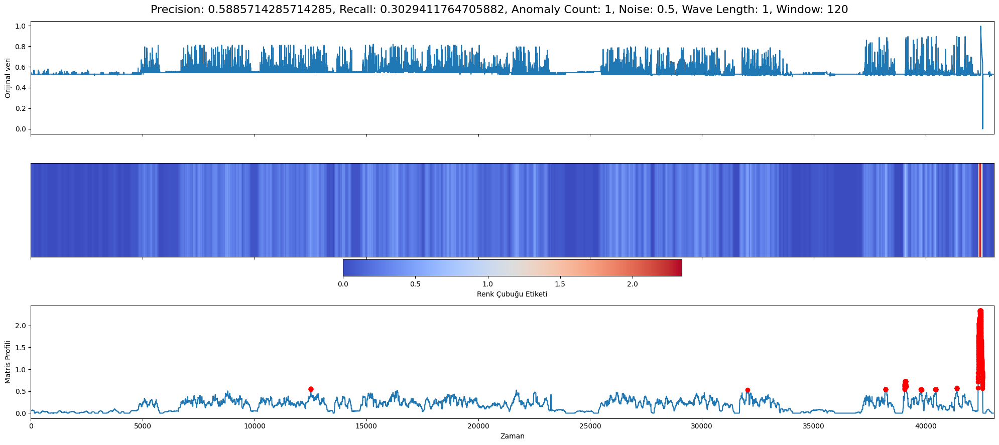

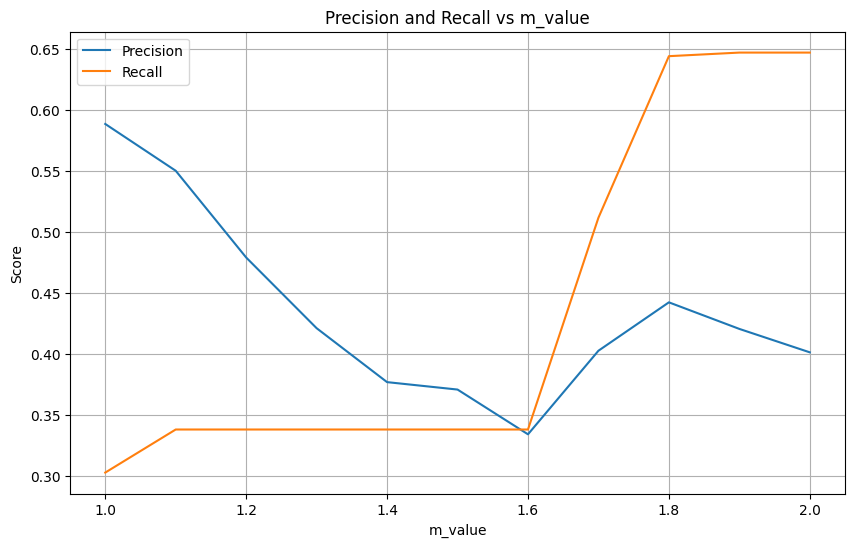

In [109]:
df3 = df1.copy()
df3, anomaly_points = lib.preprocess.anomaly.apply_anomaly(df3, noise = 0.25, anomaly_normal_ratio = 0.00013, noise_direction = 'n', random_state = 300,wave = True, wave_length = 60)

# Adding data's anomaly
anomaly_points = np.reshape(anomaly_points[sensors[-1]],-1)
anomaly_points = anomaly_points.tolist()
anomaly_points.extend([42549, 42548, 42441, 42457, 42547, 42442, 42456, 42527, 42443,
                            42546, 42455, 42545, 42444, 42544, 42528, 42543, 42542, 42541,
                            42540, 42539, 42538, 42529, 42537, 42536, 42454, 42535, 42530,
                            42534, 42445, 42533, 42531, 42532, 42453, 42446, 42452, 42451,
                            42447, 42450, 42449, 42448])

anomaly_points = np.array(anomaly_points)

window = 60 * 2  if 60 * 2 > 20 else 20

precision_values = []
recall_values = []

m = [round(i*0.1,1) for i in range(10, 21)]

plot = False

for m_value in [round(i*0.1,1) for i in range(10, 21)]:
    b = round(len(anomaly_points) * m_value)

    T_full = df3[sensors[-1]]
    stream = stumpy.stumpi(T_full, window, egress=True, normalize=False)

    discords = np.argsort(stream.P_)[-int(b):]
    precision1, recall1 = get_metrics(anomaly_points, discords, window) 

    row = {'data': 77, 'noise': noise, 'anomaly count': anomaly_count,  
    'wave len': wave_length, 'window' : window, 'precision' : precision1, 'recall' : recall1, 
    'anomaly_normal_ratio' : anomaly_normal_ratio, 'noise direction' : 'n', 'm' : m_value}
    
    df_results3 = pd.concat([df_results3, pd.DataFrame([row])], ignore_index=True)

   
    precision_values.append(precision1)
    recall_values.append(recall1)

    if not plot:
        plot_mp_results(df1, stream.P_, precision1, recall1, anomaly_count, noise, wave_length, window, discord_count=b)
        plot = True
   

plot_metrics(precision_values, recall_values, m)


In [110]:
df_results3

,data,noise,anomaly count,wave len,window,precision,recall,anomaly_normal_ratio,noise direction,m
0,77,0.5,1,1,120,0.588571,0.302941,0.000025,n,1.0
1,77,0.5,1,1,120,0.550239,0.338235,0.000025,n,1.1
2,77,0.5,1,1,120,0.479167,0.338235,0.000025,n,1.2
3,77,0.5,1,1,120,0.421245,0.338235,0.000025,n,1.3
4,77,0.5,1,1,120,0.377049,0.338235,0.000025,n,1.4
5,77,0.5,1,1,120,0.370968,0.338235,0.000025,n,1.5
6,77,0.5,1,1,120,0.334302,0.338235,0.000025,n,1.6
7,77,0.5,1,1,120,0.402778,0.511765,0.000025,n,1.7
8,77,0.5,1,1,120,0.442424,0.644118,0.000025,n,1.8
9,77,0.5,1,1,120,0.420650,0.647059,0.000025,n,1.9


In [116]:
df_res = pd.DataFrame(columns=['noise', 'anomaly count',  'wave len', 'anomaly_normal_ratio', 'img'])

In [117]:
wave_lengths = [1, 15, 60]
noises = [0.5, 0.25, 0.1]
anomaly_counts = [1, 5, 10]
anomaly_normal_ratios = {1: 0.000025, 5: 0.00013, 10: 0.00024}

num = 1
for wave_length in wave_lengths:
    for noise in noises:
        for anomaly_count in anomaly_counts:
            anomaly_normal_ratio = anomaly_normal_ratios[anomaly_count]
            row = {'noise': noise, 'anomaly count': anomaly_count,  
            'wave len': wave_length, 'anomaly_normal_ratio' : anomaly_normal_ratio, 'img' : "{}.png".format(num)}
            num+=1
            df_res = pd.concat([df_res, pd.DataFrame([row])], ignore_index=True)

In [118]:
df_res

,noise,anomaly count,wave len,anomaly_normal_ratio,img
0,0.50,1,1,0.000025,1.png
1,0.50,5,1,0.000130,2.png
2,0.50,10,1,0.000240,3.png
3,0.25,1,1,0.000025,4.png
4,0.25,5,1,0.000130,5.png
5,0.25,10,1,0.000240,6.png
6,0.10,1,1,0.000025,7.png
7,0.10,5,1,0.000130,8.png
8,0.10,10,1,0.000240,9.png
9,0.50,1,15,0.000025,10.png
